# EDA: Part 1 -- Cohort 1 Wave 2

## Outline of EDA:

1. Prepare X and Y datasets


2. Univariate Analysis    
    
    - Visualizing Distributions:
    
        - Demographics
    
        - Features (Services)
        
        - Targets (Outcomes)        


3. Bivariate Analysis

    - Visualizing and Hypothesis Testing: 
    
        Relationships between:
    
        - Demographics and Features
        
        - Demographics and Targets
        
        - Features and Targets
        
##### For EDA highlights, check out my blog post at: 


In [127]:
# Loading needed libraries and tools...

import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import math
import psycopg2 as psy
from sqlalchemy import create_engine
from sqlalchemy.engine.url import URL
import pandas.io.sql as psql
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import chi2_contingency

%matplotlib inline


In [128]:
# Loading data from local postgres DB...

In [129]:
connection = psy.connect("dbname=nytd_clean_data user=cguy")

cohort_1 = psql.read_sql("SELECT * FROM cohort1_wave2", connection)

In [130]:
cohort_1 = cohort_1.drop('index',axis=1)
cohort_1.describe()

,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,RaceDcln,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,7354.0,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,...,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.00000,7354.000000,7354.000000
mean,2011.0,24.421539,1.507615,0.042970,0.014278,0.337775,0.005847,0.572750,0.444928,3.010199,...,3.354229,3.281208,3.177047,3.034539,3.044874,3.088251,3.159097,9.12755,3.937313,16.571118
std,0.0,16.349738,0.499976,0.202803,0.118642,0.472984,0.076248,0.494713,5.733890,14.777760,...,14.742194,14.756146,14.775400,14.800515,14.798741,14.791215,14.778642,25.87891,11.332458,0.495225
min,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,16.000000
25%,2011.0,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,16.000000
50%,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,2.000000,17.000000
75%,2011.0,37.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.00000,3.000000,17.000000
max,2011.0,56.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.00000,99.000000,18.000000


# 1) Examine data and create X and Y datasets: 

In [131]:
# Dropping outcomes that are not needed for this analysis:

cohort_1 = cohort_1.drop(['SocSecrty','EducAid','Children','Marriage'], axis=1)

In [132]:
cohort_1.columns

Index([u'Wave', u'StFCID', u'RepDate_outcomes', u'OutcmRpt', u'OutcmDte',
       u'OutcmFCS', u'CurrFTE', u'CurrPTE', u'EmplySklls', u'PubFinAs',
       u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrenRoll',
       u'CnctAdult', u'Homeless', u'SubAbuse', u'Incarc', u'Medicaid',
       u'OthrHlthIn', u'MedicalIn', u'MentlHlthIn', u'PrescripIn',
       u'SampleState', u'InSample', u'Baseline', u'FY11Cohort', u'Elig19',
       u'Responded', u'FY', u'RepDate_services', u'StFIPS', u'St', u'DOB',
       u'Sex', u'AmIAKN', u'Asian', u'BlkAfrAm', u'HawaiiPI', u'White',
       u'RaceUnkn', u'RaceDcln', u'HisOrgin', u'FCStatSv', u'TribeSv',
       u'DelinqntSv', u'EdLevlSv', u'SpecEdSv', u'ILNAsv', u'AcSuppSv',
       u'PSEdSuppSv', u'CareerSv', u'EmplyTrSv', u'BudgetSv', u'HousEdSv',
       u'HlthEdSv', u'FamSuppSv', u'MentorSv', u'SILsv', u'RmBrdFASv',
       u'EducFinaSv', u'OthrFinaSv', u'Race', u'RaceEthn', u'AgeMP'],
      dtype='object')

In [133]:
# Seperate dataframe into feature vars (inputs) and target vars (outcomes)

targets = cohort_1[['PubFoodAs','PubHousAs','OthrFinAs','HighEdCert','CurrFTE','CurrPTE', \
                     'PubFinAs','CurrenRoll','PrescripIn','Homeless','SubAbuse','Incarc','Medicaid',\
                     'CnctAdult','EmplySklls','OthrHlthIn','MedicalIn','MentlHlthIn']]


features = cohort_1[['ILNAsv','AcSuppSv','PSEdSuppSv','CareerSv','EmplyTrSv','BudgetSv','HousEdSv','HlthEdSv',\
                     'FamSuppSv','MentorSv','SILsv','RmBrdFASv','EducFinaSv','OthrFinaSv']]


In [134]:
for column in features:
    print (column + str(features[column].unique()))

ILNAsv[ 0  1 77]
AcSuppSv[ 0  1 77]
PSEdSuppSv[ 0  1 77]
CareerSv[ 0  1 77]
EmplyTrSv[ 0  1 77]
BudgetSv[ 0  1 77]
HousEdSv[ 1  0 77]
HlthEdSv[ 0  1 77]
FamSuppSv[ 0  1 77]
MentorSv[ 0  1 77]
SILsv[ 0  1 77]
RmBrdFASv[ 0  1 77]
EducFinaSv[ 0  1 77]
OthrFinaSv[ 1  0 77]


In [135]:
for column in targets:
    print (column + str(targets[column].unique()))

PubFoodAs['Yes' 'No' 'Not Applicable (in Foster Care)' 'Blank' 'Declined']
PubHousAs['No' 'Not Applicable (in Foster Care)' 'Declined' 'Yes' 'Blank']
OthrFinAs['No' 'Yes' 'Declined' 'Blank']
HighEdCert['None of the above' 'High school diploma/GED' 'Blank'
 'Vocational certificate' 'Declined' "Bachelor's Degree"
 'Vocational license' "Associate's Degree" 'Higher degree' None]
CurrFTE['No' 'Yes, employed full time' 'Blank' 'Declined']
CurrPTE['No' 'Yes, employed part time' 'Blank' 'Declined']
PubFinAs['No' 'Not Applicable (in Foster Care)' 'Declined' 'Yes' 'Blank']
CurrenRoll['No' 'Yes' 'Declined' 'Blank']
PrescripIn['Not Applicable' 'Yes' 'Blank' "Don't Know" 'Declined' 'No']
Homeless['Yes' 'No' 'Blank' 'Declined']
SubAbuse['No' 'Yes' 'Declined' 'Blank']
Incarc['No' 'Yes' 'Declined' 'Blank']
Medicaid['Yes' 'No' 'Do Not Know' 'Blank' 'Declined']
CnctAdult['Yes' 'No' 'Blank' 'Declined']
EmplySklls['No' 'Yes' 'Blank' 'Declined']
OthrHlthIn['No' 'Yes' 'Blank' 'Do Not Know' '78.0' 'Declined'

In [136]:
# # Create column for number of services received

services_count = features.T

features['Num_services'] = (services_count == 1).sum()
features.head(10)

/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,ILNAsv,AcSuppSv,PSEdSuppSv,CareerSv,EmplyTrSv,BudgetSv,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Num_services
0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,2
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
2,1,0,0,0,0,0,0,0,0,0,0,0,1,1,3
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
6,1,0,0,0,0,0,1,1,0,0,0,0,0,1,4
7,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
9,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2


# 2) UNIVARIATE ANALYSIS

# Distributions

## Demographics

In [137]:
demographics = cohort_1[['St','DelinqntSv','Sex','Race','TribeSv','EdLevlSv','SpecEdSv','RaceEthn','AgeMP']]

In [138]:
demographics.AgeMP.value_counts()

17    4198
16    3155
18       1
Name: AgeMP, dtype: int64

In [139]:
# Remember, foster youth who were 17 yrs or within 45 days of their 17th birthday were included in the sampling frame
# --hence the age range

# Don't need age
demographics = demographics.drop('AgeMP',axis=1)

In [140]:
# Sample stratified by state

In [141]:
state_density_c1 = demographics.St.value_counts()

state_density_c1 = state_density_c1.to_frame()
state_density_c1.reset_index(inplace=True)
state_density_c1.columns = ['State', 'Count_FosterYouth']

# Need to add state name to dataframe. Will use library for dictionary...

import us

def add_st_name(data_abbr):
    state_dict = us.states.mapping('abbr', 'name')
    name = state_dict.get(data_abbr, None)
    return name

state_density_c1['st_name'] = state_density_c1.State.apply(add_st_name)
    
state_density_c1 = state_density_c1.set_index(['State'])
state_density_c1

,Count_FosterYouth,st_name
State,,
CA,1429,California
IA,463,Iowa
GA,363,Georgia
LA,342,Louisiana
FL,313,Florida
SC,284,South Carolina
NY,282,New York
KS,274,Kansas
MO,271,Missouri


In [17]:
state_density_c1.to_csv('~/Desktop/capstone_clean_data/state_density_c1.csv')


##### I used RStudio to run the R code  pasted below. By using R, I was able to create a GoogleVis Chart to display the population density by US state. The chart is displayed in the web browser, and thus has a URL. So, then I used the class IPython.display to display this interactive chart in the jupyter notebook. You can hover over the states to see exact count per state.

** Note: The interactive chart will not display in the github repo. To see the interactive chart, check out this link: http://ec2-54-200-137-211.us-west-2.compute.amazonaws.com/geoStates/heatMap.html

In [18]:
# R code used:

#         > state_density_c1 <- read.csv("~/Desktop/capstone_clean_data/state_density_c1.csv")
#         >   View(state_density_c1)
#         >
#         > install.packages('googleVis')
#         > 
#         > library(googleVis)
#         > 
#         > GeoStates <- gvisGeoChart(state_density_c1, "st_name", "Count_FosterYouth",
#         +                           options=list(region="US", 
#         +                                        displayMode="regions", 
#         +                                        resolution="provinces",
#         +                                        width=600, height=400))
#         >
#         > plot(GeoStates)


In [19]:
from IPython.display import IFrame
print
print "US Foster Youth Population (n) Heat Map"

IFrame('http://ec2-54-200-137-211.us-west-2.compute.amazonaws.com/geoStates/heatMap.html', width=700, height=450)


US Foster Youth Population (n) Heat Map


<img src="heatMap.png">

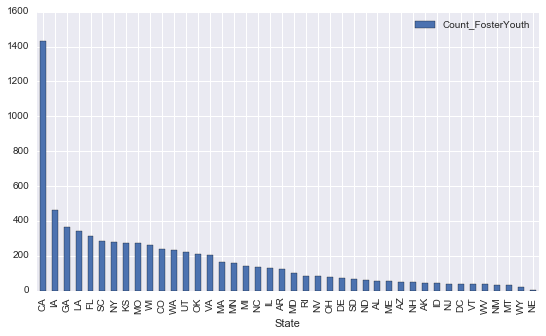

In [20]:
state_density_c1.plot(kind='bar', figsize=(9,5))

In [21]:
# Sample stratified by Demographics

In [22]:
# Gender

In [23]:
gender = demographics.Sex.value_counts()

gender = gender.to_frame()
gender.reset_index(inplace=True)
gender.columns = ['Sex', 'Count_FosterYouth']

gender

# 1 = Male, 2 = Female

,Sex,Count_FosterYouth
0,2,3733
1,1,3621


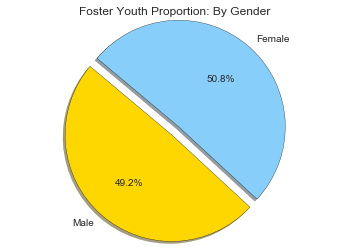

In [24]:
# Data to plot
labels = 'Male', 'Female'

male = gender.at[1,'Count_FosterYouth']
female = gender.at[0,'Count_FosterYouth']

data_count = [male,female]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Gender')
plt.show()

----------

In [25]:
# Race

In [26]:
race = demographics.Race.value_counts()

race = race.to_frame()
race.reset_index(inplace=True)
race.columns = ['Race', 'Count_FosterYouth']

race

# White = 1
# Black/African American = 2
# Am Id/AK Native = 3
# Asian = 4
# Pac Islander = 5
# More than 1 Race = 6
# Race Unknown = 99

,Race,Count_FosterYouth
0,1,3898
1,2,2259
2,99,562
3,6,352
4,3,192
5,4,73
6,5,18


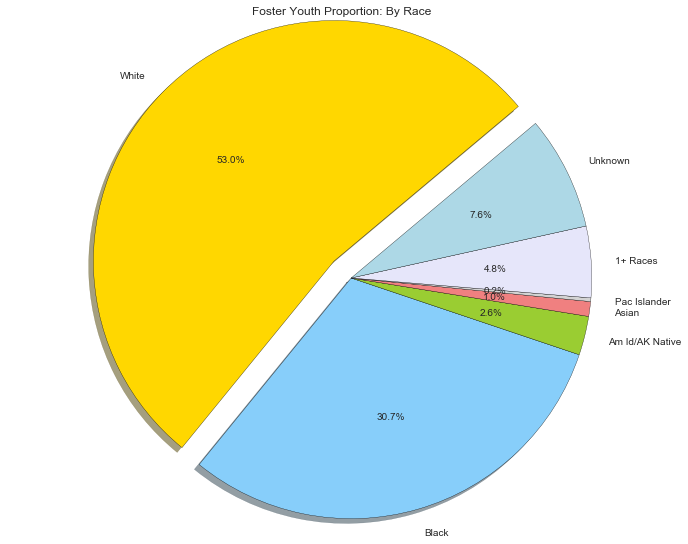

In [27]:
# Data to plot
labels = 'White', 'Black', 'Am Id/AK Native', 'Asian', 'Pac Islander', '1+ Races', 'Unknown'

white = race.at[0,'Count_FosterYouth']
black = race.at[1,'Count_FosterYouth']
native = race.at[4,'Count_FosterYouth']
azn = race.at[5,'Count_FosterYouth']
pac = race.at[6,'Count_FosterYouth']
mult = race.at[3,'Count_FosterYouth']
unk = race.at[2,'Count_FosterYouth']

data_count = [white,black,native,azn,pac,mult,unk]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lavender', 'lightblue']
explode = (0.1, 0, 0, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Race')

plt.show()

----

In [28]:
# Ethnicity

In [29]:
ethn = demographics.RaceEthn.value_counts()

ethn = ethn.to_frame()
ethn.reset_index(inplace=True)
ethn.columns = ['Ethnicity', 'Count_FosterYouth']

ethn

# Non-Hispanic White = 1
# NH Black/African American = 2
# NH Am Id/AK Native = 3
# NH Asian = 4
# NH Pac Islander = 5
# NH More than 1 Race = 6
# Hispanic = 7
# Race Unknown = 99


,Ethnicity,Count_FosterYouth
0,1,3253
1,2,2189
2,7,1272
3,6,301
4,3,161
5,99,99
6,4,65
7,5,14


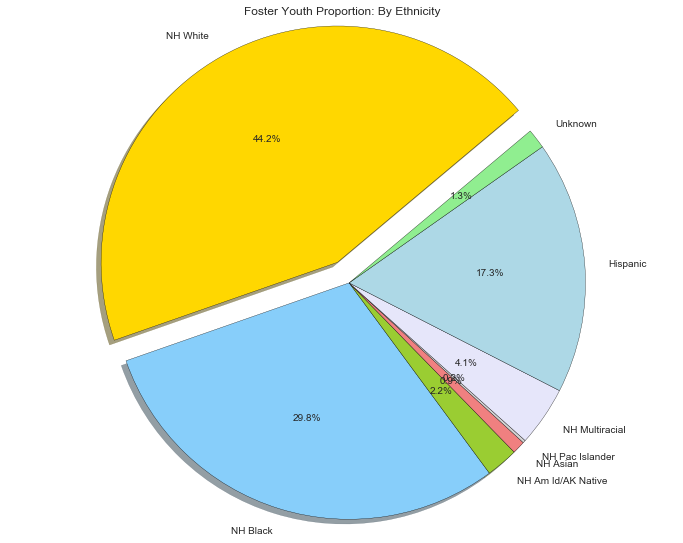

In [30]:
# Data to plot
labels = 'NH White', 'NH Black', 'NH Am Id/AK Native', 'NH Asian', 'NH Pac Islander', 'NH Multiracial',\
'Hispanic','Unknown'

white = ethn.at[0,'Count_FosterYouth']
black = ethn.at[1,'Count_FosterYouth']
native = ethn.at[4,'Count_FosterYouth']
azn = ethn.at[6,'Count_FosterYouth']
pac = ethn.at[7,'Count_FosterYouth']
mult = ethn.at[3,'Count_FosterYouth']
hisp = ethn.at[2, 'Count_FosterYouth']
unk = ethn.at[5,'Count_FosterYouth']

data_count = [white,black,native,azn,pac,mult,hisp,unk]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lavender', 'lightblue','lightgreen']
explode = (0.1, 0, 0, 0, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Ethnicity')

plt.show()


----

In [31]:
# Education Level

In [32]:
edu = demographics.EdLevlSv.value_counts()

edu = edu.to_frame()
edu.reset_index(inplace=True)
edu.columns = ['Education_Lvl', 'Count_FosterYouth']

edu

# 0 = Less than 6th grade
# 6 = 6th grade
# 7 = 7th grade
# 8 = 8th grade
# 9 = 9th grade
# 10 = 10th grade
# 11 = 11th grade
# 12 = 12th grade
# 13 = Post secondary
# 14 = College
# 77 = Blank


,Education_Lvl,Count_FosterYouth
0,10,2397
1,11,1938
2,9,1480
3,8,513
4,77,410
5,12,332
6,7,100
7,0,63
8,6,45
9,13,43


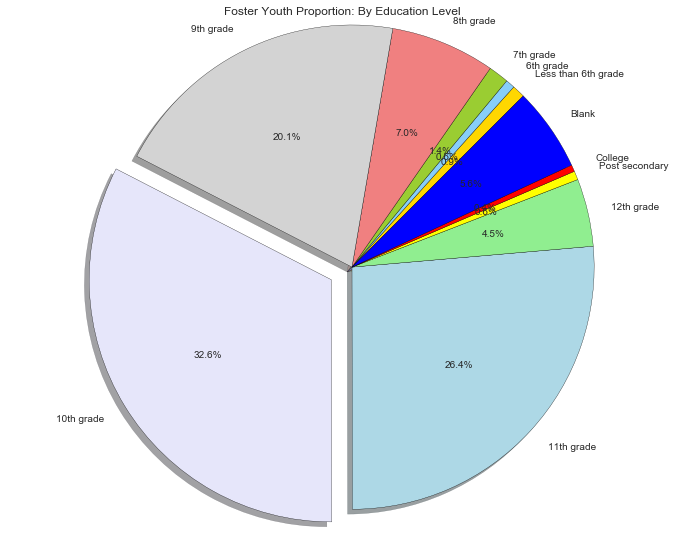

In [33]:
# Data to plot
labels = 'Less than 6th grade', '6th grade', '7th grade', '8th grade', '9th grade', '10th grade',\
'11th grade','12th grade', 'Post secondary', 'College', 'Blank'

less_6 = edu.at[7,'Count_FosterYouth']
six = edu.at[8,'Count_FosterYouth']
seven = edu.at[6,'Count_FosterYouth']
eight = edu.at[3,'Count_FosterYouth']
nine = edu.at[2,'Count_FosterYouth']
ten = edu.at[0,'Count_FosterYouth']
eleven = edu.at[1,'Count_FosterYouth']
twelve = edu.at[5,'Count_FosterYouth']
post = edu.at[9,'Count_FosterYouth']
college = edu.at[10,'Count_FosterYouth']
blank = edu.at[4,'Count_FosterYouth']

data_count = [less_6,six,seven,eight,nine,ten,eleven,twelve,post,college,blank]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lavender', 'lightblue','lightgreen',\
          'yellow', 'red', 'blue']
explode = (0, 0, 0, 0, 0, 0.1, 0, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=45)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Education Level')

plt.show()


----

In [34]:
# Delinquincy Status

In [35]:
delin = demographics.DelinqntSv.value_counts()

delin = delin.to_frame()
delin.reset_index(inplace=True)
delin.columns = ['DelinqntSv', 'Count_FosterYouth']

delin

# 0 = No
# 1 = Yes
# 77 = Blank


,DelinqntSv,Count_FosterYouth
0,0,5710
1,1,1361
2,77,283


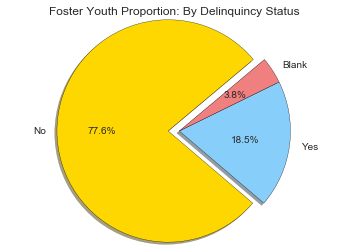

In [36]:
# Data to plot
labels = 'No', 'Yes', 'Blank'

no = delin.at[0,'Count_FosterYouth']
yes = delin.at[1,'Count_FosterYouth']
blank = delin.at[2,'Count_FosterYouth']

data_count = [no,yes,blank]
colors = ['gold', 'lightskyblue', 'lightcoral']
explode = (0.1, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(6, 4))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Delinquincy Status')

plt.show()


----

In [37]:
# Tribe Status

In [38]:
tribe = demographics.TribeSv.value_counts()

tribe = tribe.to_frame()
tribe.reset_index(inplace=True)
tribe.columns = ['TribeSv', 'Count_FosterYouth']

tribe

# 0 = No
# 1 = Yes
# 77 = Blank


,TribeSv,Count_FosterYouth
0,0,6837
1,77,282
2,1,235


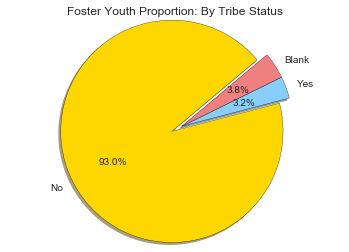

In [39]:
# Data to plot
labels = 'No', 'Yes', 'Blank'

no = tribe.at[0,'Count_FosterYouth']
yes = tribe.at[2,'Count_FosterYouth']
blank = tribe.at[1,'Count_FosterYouth']

data_count = [no,yes,blank]
colors = ['gold', 'lightskyblue', 'lightcoral']
explode = (0.1, 0, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Tribe Status')

plt.show()


----

In [40]:
# Special Ed Status

In [41]:
sped = demographics.SpecEdSv.value_counts()

sped = sped.to_frame()
sped.reset_index(inplace=True)
sped.columns = ['SpecEdSv', 'Count_FosterYouth']

sped

# 0 = No
# 1 = Yes
# 77 = Blank


,SpecEdSv,Count_FosterYouth
0,0,5194
1,1,1851
2,77,309


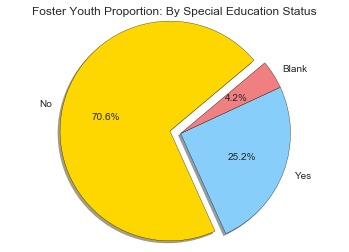

In [42]:
 # Data to plot
labels = 'No', 'Yes', 'Blank'

no = sped.at[0,'Count_FosterYouth']
yes = sped.at[1,'Count_FosterYouth']
blank = sped.at[2,'Count_FosterYouth']

data_count = [no,yes,blank]
colors = ['gold', 'lightskyblue', 'lightcoral']
explode = (0.1, 0, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Special Education Status')

plt.show()


_________________________________________________________________________________________________________
_________________________________________________________________________________________________________

## Services (aka: inputs; features)

In [43]:
features.columns

Index([u'ILNAsv', u'AcSuppSv', u'PSEdSuppSv', u'CareerSv', u'EmplyTrSv',
       u'BudgetSv', u'HousEdSv', u'HlthEdSv', u'FamSuppSv', u'MentorSv',
       u'SILsv', u'RmBrdFASv', u'EducFinaSv', u'OthrFinaSv', u'Num_services'],
      dtype='object')

In [44]:
# Create functions for repeating code

def create_val_cnt_table(series_of_interest):
    
    
    val_cnt_table = series_of_interest.value_counts()
    val_cnt_table = val_cnt_table.to_frame()
    val_cnt_table.reset_index(inplace=True)
    val_cnt_table.columns = ['Service_Status', 'Count_FosterYouth']

    return val_cnt_table

#####

def plot_pie(no,yes,blank,title):
    # Data to plot
    labels = 'No', 'Yes', 'Blank'
    data_count = [no,yes,blank]
    colors = ['gold', 'lightskyblue', 'lightcoral']
    explode = (0.1, 0, 0)  # explode 1st slice
 
    # Plot
    plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
 
    plt.axis('equal')
    plt.title(title)

    return plt.show()
    

In [45]:
# Independent Needs Assessment

ilna = create_val_cnt_table(features['ILNAsv'])
ilna

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,1,3967
1,0,3104
2,77,283


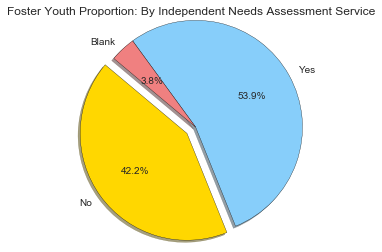

In [46]:
no = ilna.at[1,'Count_FosterYouth']
yes = ilna.at[0,'Count_FosterYouth']
blank = ilna.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Independent Needs Assessment Service'

plot_pie(no,yes,blank,title)


----

In [47]:
# Academic Support Service

AcSuppSv = create_val_cnt_table(features['AcSuppSv'])
AcSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,1,3779
1,0,3292
2,77,283


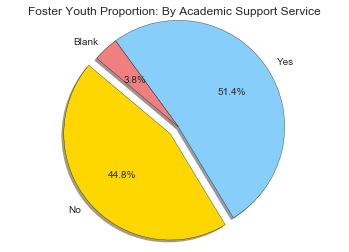

In [48]:
no = AcSuppSv.at[1,'Count_FosterYouth']
yes = AcSuppSv.at[0,'Count_FosterYouth']
blank = AcSuppSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Academic Support Service'

plot_pie(no,yes,blank,title)

__________________________________________________________________________________________________________________


In [49]:
# Post-Secondary Support Service

PSEdSuppSv = create_val_cnt_table(features['PSEdSuppSv'])
PSEdSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5626
1,1,1445
2,77,283


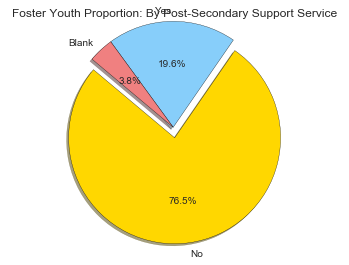

In [50]:
no = PSEdSuppSv.at[0,'Count_FosterYouth']
yes = PSEdSuppSv.at[1,'Count_FosterYouth']
blank = PSEdSuppSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Post-Secondary Support Service'

plot_pie(no,yes,blank,title)

__________________________________________________________________________________________________________________


In [51]:

# Career Service

CareerSv = create_val_cnt_table(features['CareerSv'])
CareerSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4024
1,1,3047
2,77,283


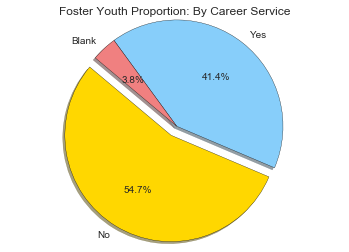

In [52]:
no = CareerSv.at[0,'Count_FosterYouth']
yes = CareerSv.at[1,'Count_FosterYouth']
blank = CareerSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Career Service'

plot_pie(no,yes,blank,title)

----

In [53]:
# Employee Training Service

EmplyTrSv = create_val_cnt_table(features['EmplyTrSv'])
EmplyTrSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5188
1,1,1883
2,77,283


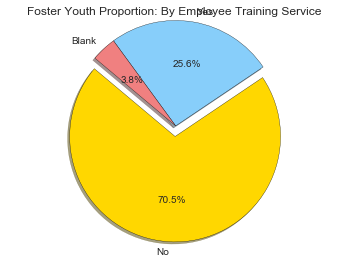

In [54]:
no = EmplyTrSv.at[0,'Count_FosterYouth']
yes = EmplyTrSv.at[1,'Count_FosterYouth']
blank = EmplyTrSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Employee Training Service'

plot_pie(no,yes,blank,title)

----

In [55]:
# Budget Service

BudgetSv = create_val_cnt_table(features['BudgetSv'])
BudgetSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4371
1,1,2700
2,77,283


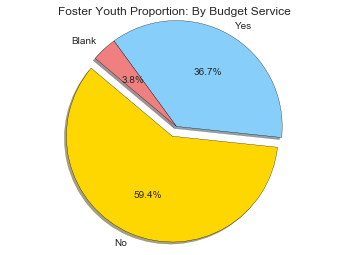

In [56]:
no = BudgetSv.at[0,'Count_FosterYouth']
yes = BudgetSv.at[1,'Count_FosterYouth']
blank = BudgetSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Budget Service'

plot_pie(no,yes,blank,title)

----

In [57]:
# Housing Education Service

HousEdSv = create_val_cnt_table(features['HousEdSv'])
HousEdSv

# 0 = No
# 1 = Yes
# 77 = Blank


,Service_Status,Count_FosterYouth
0,0,4304
1,1,2767
2,77,283


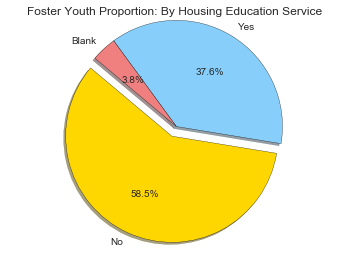

In [58]:
no = HousEdSv.at[0,'Count_FosterYouth']
yes = HousEdSv.at[1,'Count_FosterYouth']
blank = HousEdSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Housing Education Service'

plot_pie(no,yes,blank,title)

----

In [59]:
# Health Education Service

HlthEdSv = create_val_cnt_table(features['HlthEdSv'])
HlthEdSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4195
1,1,2876
2,77,283


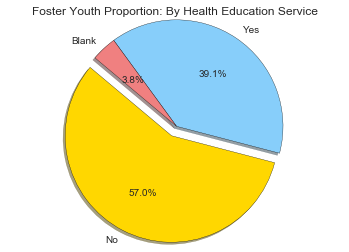

In [60]:
no = HlthEdSv.at[0,'Count_FosterYouth']
yes = HlthEdSv.at[1,'Count_FosterYouth']
blank = HlthEdSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Health Education Service'

plot_pie(no,yes,blank,title)

----

In [61]:
# Family Support Service

FamSuppSv = create_val_cnt_table(features['FamSuppSv'])
FamSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4732
1,1,2339
2,77,283


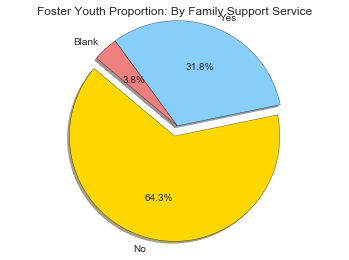

In [62]:
no = FamSuppSv.at[0,'Count_FosterYouth']
yes = FamSuppSv.at[1,'Count_FosterYouth']
blank = FamSuppSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Family Support Service'

plot_pie(no,yes,blank,title)

----

In [63]:
# Mentoring Service

MentorSv = create_val_cnt_table(features['MentorSv'])
MentorSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5498
1,1,1573
2,77,283


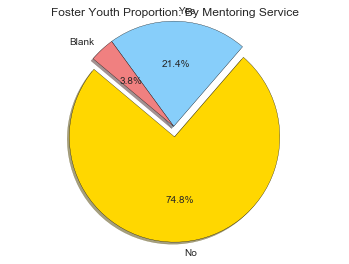

In [64]:
no = MentorSv.at[0,'Count_FosterYouth']
yes = MentorSv.at[1,'Count_FosterYouth']
blank = MentorSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Mentoring Service'

plot_pie(no,yes,blank,title)

----

In [65]:
# Supervised Independent Living Service

SILsv = create_val_cnt_table(features['SILsv'])
SILsv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6546
1,1,525
2,77,283


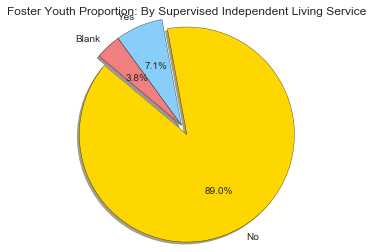

In [66]:
no = SILsv.at[0,'Count_FosterYouth']
yes = SILsv.at[1,'Count_FosterYouth']
blank = SILsv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Supervised Independent Living Service'

plot_pie(no,yes,blank,title)

----

In [67]:
# Room and Board FinAid Service

RmBrdFASv = create_val_cnt_table(features['RmBrdFASv'])
RmBrdFASv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6470
1,1,601
2,77,283


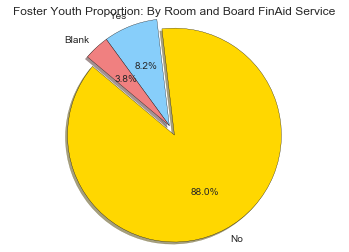

In [68]:
no = RmBrdFASv.at[0,'Count_FosterYouth']
yes = RmBrdFASv.at[1,'Count_FosterYouth']
blank = RmBrdFASv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Room and Board FinAid Service'

plot_pie(no,yes,blank,title)

----

In [69]:
# Education Finance Service

EducFinaSv = create_val_cnt_table(features['EducFinaSv'])
EducFinaSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6151
1,1,920
2,77,283


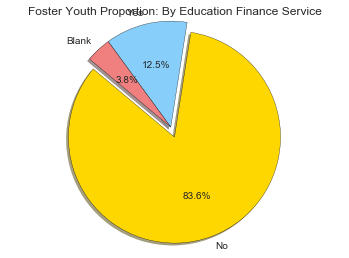

In [70]:
no = EducFinaSv.at[0,'Count_FosterYouth']
yes = EducFinaSv.at[1,'Count_FosterYouth']
blank = EducFinaSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Education Finance Service'

plot_pie(no,yes,blank,title)

----

In [71]:
# Other Finance Service

OthrFinaSv = create_val_cnt_table(features['OthrFinaSv'])
OthrFinaSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5630
1,1,1441
2,77,283


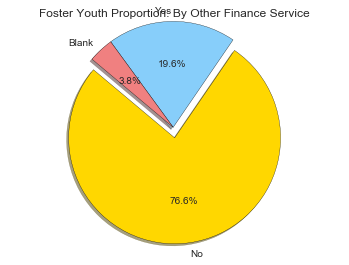

In [72]:
no = OthrFinaSv.at[0,'Count_FosterYouth']
yes = OthrFinaSv.at[1,'Count_FosterYouth']
blank = OthrFinaSv.at[2,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Other Finance Service'

plot_pie(no,yes,blank,title)

----

In [73]:
# Number of Services Distribution

Num_services = create_val_cnt_table(features['Num_services'])
Num_services = Num_services.sort_values(by='Service_Status')
Num_services.columns = ['Num_services', 'Count_FosterYouth']

Num_services

,Num_services,Count_FosterYouth
8,0,289
0,1,1560
1,2,1096
2,3,918
3,4,739
4,5,662
5,6,530
6,7,422
7,8,402
9,9,259


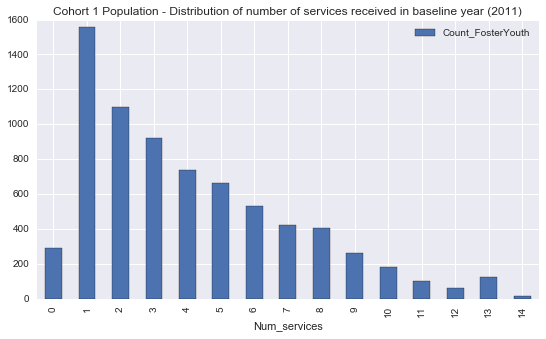

In [74]:
Num_services.plot(kind='bar',x='Num_services',y='Count_FosterYouth', title='Cohort 1 Population - Distribution of number of services received in baseline year (2011)', figsize=(9,5))

In [81]:
# From histogram above, normal distribution of number of services can be assumed...

_________________________________________________________________________________________________________
_________________________________________________________________________________________________________


## Outcomes (aka: outputs; targets)

In [77]:
targets.columns

Index([u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrFTE',
       u'CurrPTE', u'PubFinAs', u'CurrenRoll', u'PrescripIn', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'CnctAdult', u'EmplySklls',
       u'OthrHlthIn', u'MedicalIn', u'MentlHlthIn'],
      dtype='object')

In [78]:
# Create functions for repeating code

def create_val_cnt_table(series_of_interest):
    
    val_cnt_table = series_of_interest.value_counts()
    val_cnt_table = val_cnt_table.to_frame()
    val_cnt_table.reset_index(inplace=True)
    val_cnt_table.columns = ['Outcomes_Status', 'Count_FosterYouth']

    return val_cnt_table

####

def plot_bar(table_i, title=None):

    bar_plot = table_i.plot(kind='bar',x='Outcomes_Status',y='Count_FosterYouth', figsize=(9,5), title=title)
    
    return bar_plot

In [79]:
# Public Food Assistance

PubFoodAs = create_val_cnt_table(targets['PubFoodAs'])
PubFoodAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2819
1,No,1892
2,Not Applicable (in Foster Care),1642
3,Yes,937
4,Declined,64


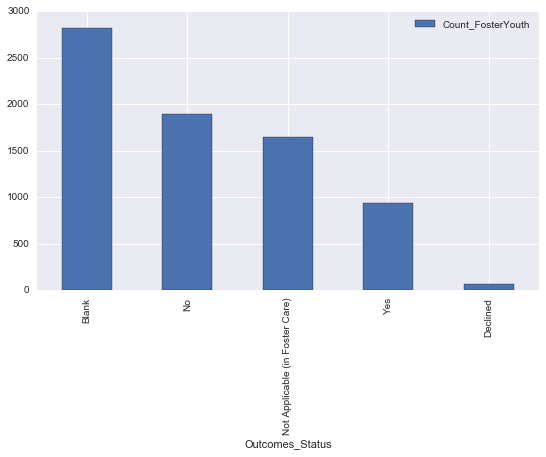

In [80]:
plot_bar(PubFoodAs)

----

In [86]:
# Public Housing Assistance

PubHousAs = create_val_cnt_table(targets['PubHousAs'])
PubHousAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2817
1,No,2629
2,Not Applicable (in Foster Care),1641
3,Yes,200
4,Declined,67


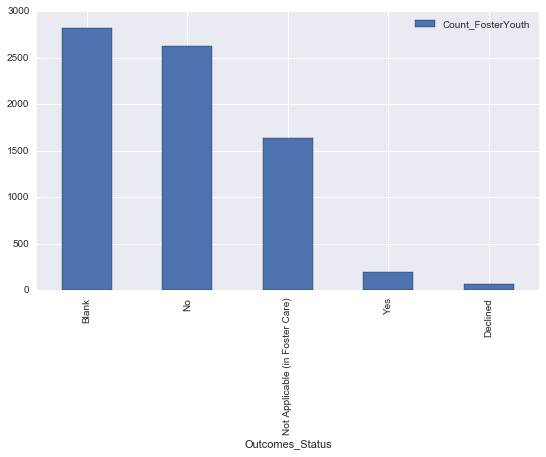

In [87]:
plot_bar(PubHousAs)

----

In [88]:
# Other Financial Assistance

OthrFinAs = create_val_cnt_table(targets['OthrFinAs'])
OthrFinAs

,Outcomes_Status,Count_FosterYouth
0,No,3717
1,Blank,2825
2,Yes,691
3,Declined,121


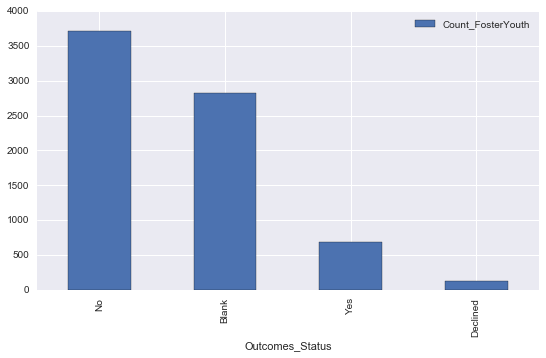

In [89]:
plot_bar(OthrFinAs)

----

In [81]:
# Higher Education Certification

HighEdCert = create_val_cnt_table(targets['HighEdCert'])
HighEdCert

,Outcomes_Status,Count_FosterYouth
0,Blank,2829
1,High school diploma/GED,2508
2,None of the above,1708
3,Declined,95
4,Vocational certificate,62
5,Vocational license,19
6,Associate's Degree,7
7,Higher degree,7
8,Bachelor's Degree,2


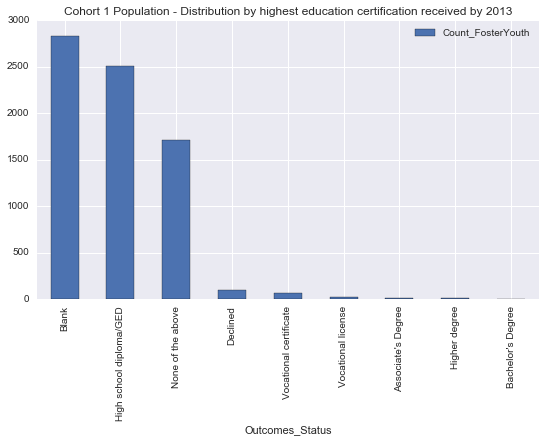

In [82]:
plot_bar(HighEdCert, 'Cohort 1 Population - Distribution by highest education certification received by 2013')

----

In [92]:
# Current Full Time Employment

CurrFTE = create_val_cnt_table(targets['CurrFTE'])
CurrFTE

,Outcomes_Status,Count_FosterYouth
0,No,3933
1,Blank,2826
2,"Yes, employed full time",537
3,Declined,58


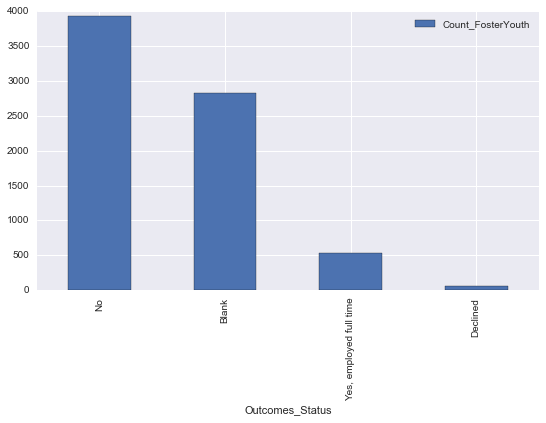

In [93]:
plot_bar(CurrFTE)

----

In [94]:
# Current Part-Time Employment

CurrPTE = create_val_cnt_table(targets['CurrPTE'])
CurrPTE

,Outcomes_Status,Count_FosterYouth
0,No,3318
1,Blank,2828
2,"Yes, employed part time",1116
3,Declined,92


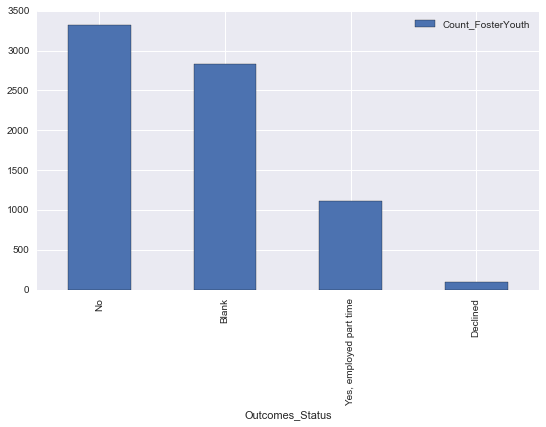

In [95]:
plot_bar(CurrPTE)

----

In [96]:
# Public Financial Assistance

PubFinAs = create_val_cnt_table(targets['PubFinAs'])
PubFinAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2823
1,No,2485
2,Not Applicable (in Foster Care),1638
3,Yes,330
4,Declined,78


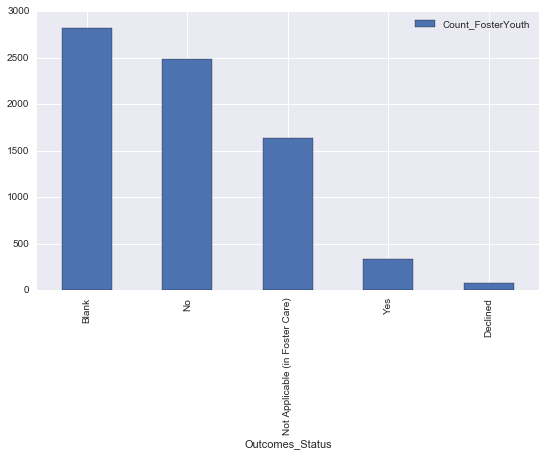

In [97]:
plot_bar(PubFinAs)

----

In [84]:
# Currently Enrolled in Higher Education

CurrenRoll = create_val_cnt_table(targets['CurrenRoll'])
CurrenRoll

,Outcomes_Status,Count_FosterYouth
0,Blank,2824
1,Yes,2452
2,No,2001
3,Declined,77


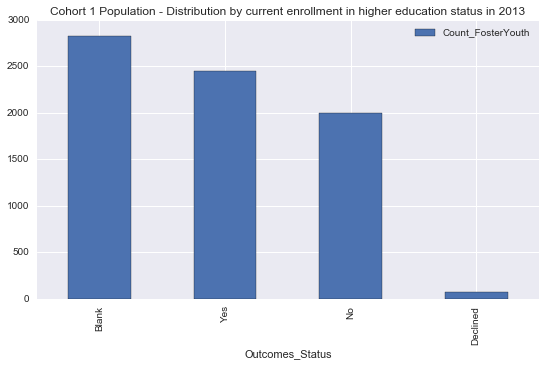

In [85]:
plot_bar(CurrenRoll, 'Cohort 1 Population - Distribution by current enrollment in higher education status in 2013')

----

In [100]:
# Rx Insurance

PrescripIn = create_val_cnt_table(targets['PrescripIn'])
PrescripIn


,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3956
1,Blank,2823
2,Yes,477
3,Don't Know,43
4,No,31
5,Declined,24


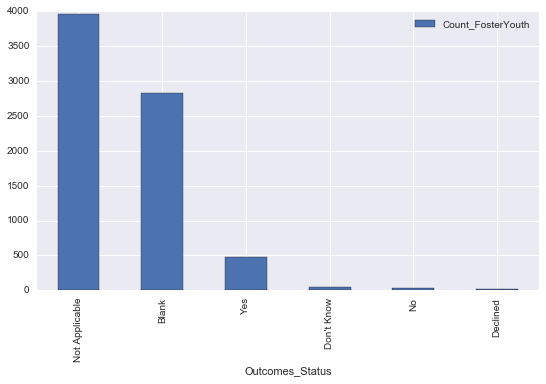

In [101]:
plot_bar(PrescripIn)

----

In [102]:
# Experienced Homelessness

Homeless = create_val_cnt_table(targets['Homeless'])
Homeless

,Outcomes_Status,Count_FosterYouth
0,No,3541
1,Blank,2826
2,Yes,885
3,Declined,102


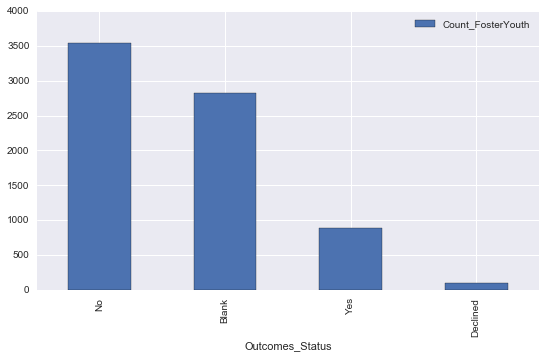

In [103]:
plot_bar(Homeless)

----

In [104]:
# Substance Abuse 

SubAbuse = create_val_cnt_table(targets['SubAbuse'])
SubAbuse

,Outcomes_Status,Count_FosterYouth
0,No,3829
1,Blank,2825
2,Yes,620
3,Declined,80


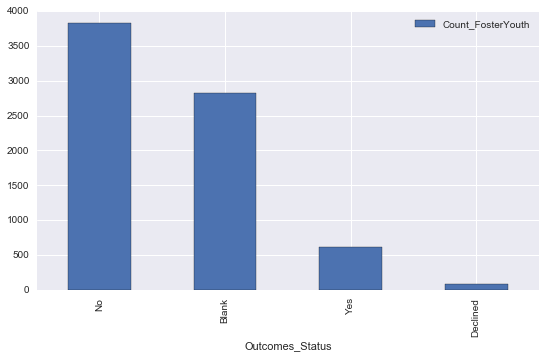

In [105]:
plot_bar(SubAbuse)

----

In [106]:
# Incarceration

Incarc = create_val_cnt_table(targets['Incarc'])
Incarc

,Outcomes_Status,Count_FosterYouth
0,No,3535
1,Blank,2827
2,Yes,901
3,Declined,91


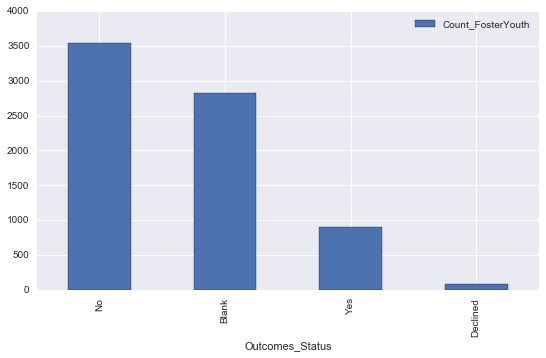

In [107]:
plot_bar(Incarc)

In [108]:
# MDCD

Medicaid = create_val_cnt_table(targets['Medicaid'])
Medicaid

,Outcomes_Status,Count_FosterYouth
0,Yes,3369
1,Blank,2825
2,No,840
3,Do Not Know,237
4,Declined,83


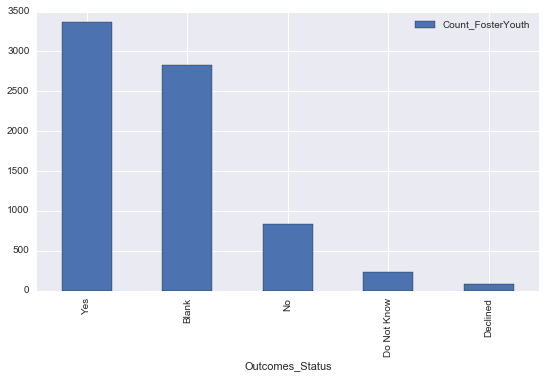

In [109]:
plot_bar(Medicaid)

----

In [110]:
# Connection to Adult

CnctAdult = create_val_cnt_table(targets['CnctAdult'])
CnctAdult

,Outcomes_Status,Count_FosterYouth
0,Yes,4108
1,Blank,2825
2,No,344
3,Declined,77


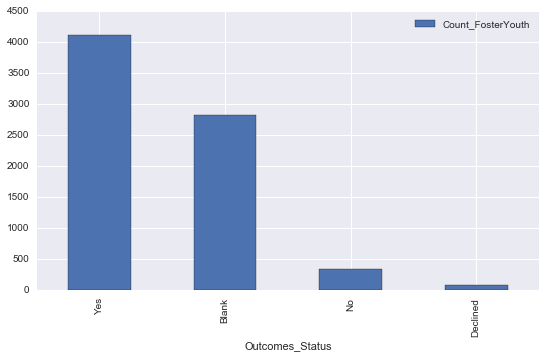

In [111]:
plot_bar(CnctAdult)

----

In [112]:
# Employee Skills Gained

EmplySklls = create_val_cnt_table(targets['EmplySklls'])
EmplySklls

,Outcomes_Status,Count_FosterYouth
0,No,2995
1,Blank,2824
2,Yes,1439
3,Declined,96


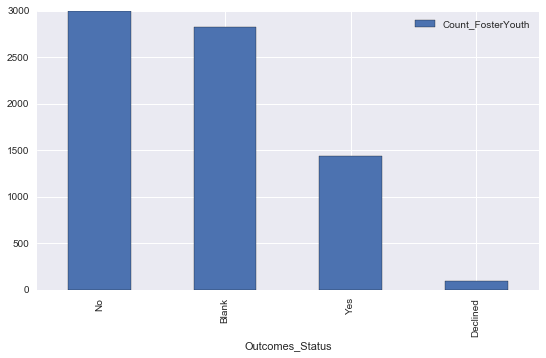

In [113]:
plot_bar(EmplySklls)

----

In [114]:
# Other Health Insurance

OthrHlthIn = create_val_cnt_table(targets['OthrHlthIn'])
OthrHlthIn['Outcomes_Status'] = OthrHlthIn['Outcomes_Status'].map({'78.0': 'Solely MDCD','No':'No',\
                                                                   'Yes':'Yes','Blank':'Blank',\
                                                                   'Do Not Know':'Do Not Know','Declined':'Declined'})
OthrHlthIn

,Outcomes_Status,Count_FosterYouth
0,No,3468
1,Blank,2826
2,Yes,625
3,Do Not Know,327
4,Declined,99
5,Solely MDCD,9


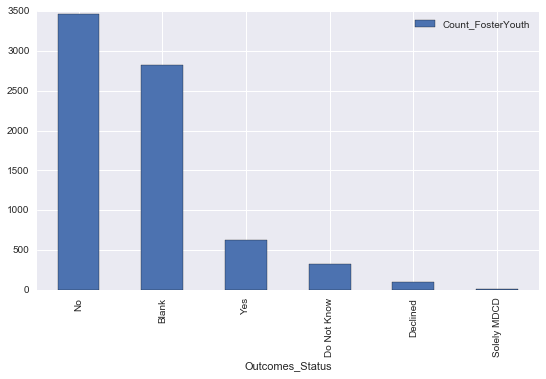

In [115]:
plot_bar(OthrHlthIn)

----

In [116]:
# Medical Insurance

MedicalIn = create_val_cnt_table(targets['MedicalIn'])
MedicalIn

,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3886
1,Blank,2823
2,Yes,543
3,Don't Know,50
4,No,39
5,Declined,13


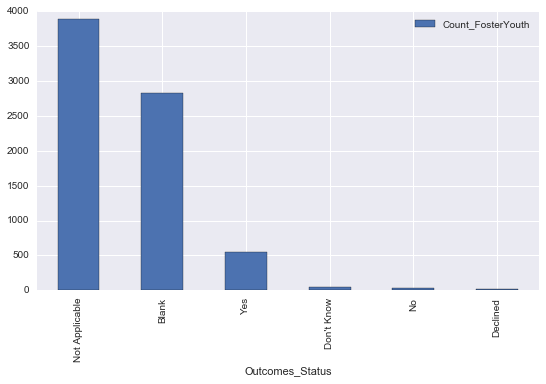

In [117]:
plot_bar(MedicalIn)

----

In [118]:
# Mental Health Insurance

MentlHlthIn = create_val_cnt_table(targets['MentlHlthIn'])
MentlHlthIn

,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3956
1,Blank,2824
2,Yes,415
3,Don't Know,86
4,No,48
5,Declined,25


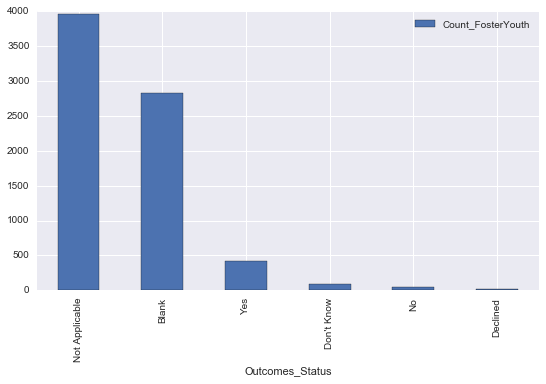

In [119]:
plot_bar(MentlHlthIn)

----

Might want to drop this target variable (MentlHlthIn) since majority are blank/not applicable.

----

# 3) BIVARIATE ANALYSIS

### LOOKING AT RELATIONSHIPS BETWEEN VARIABLES

##### Demographics by Features

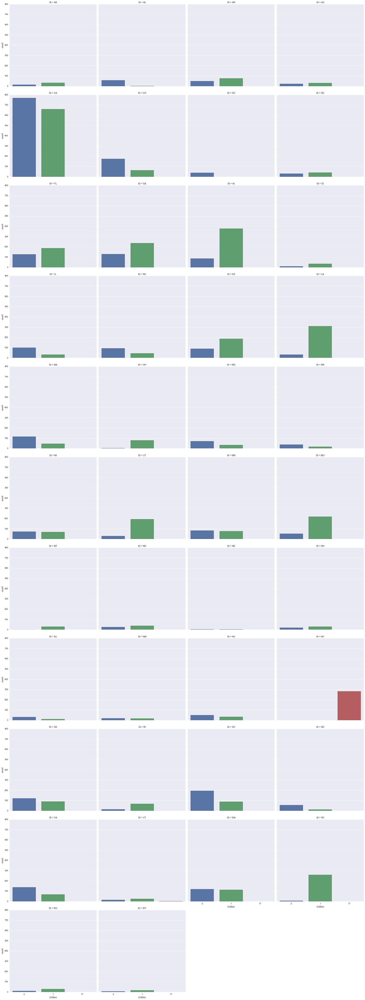

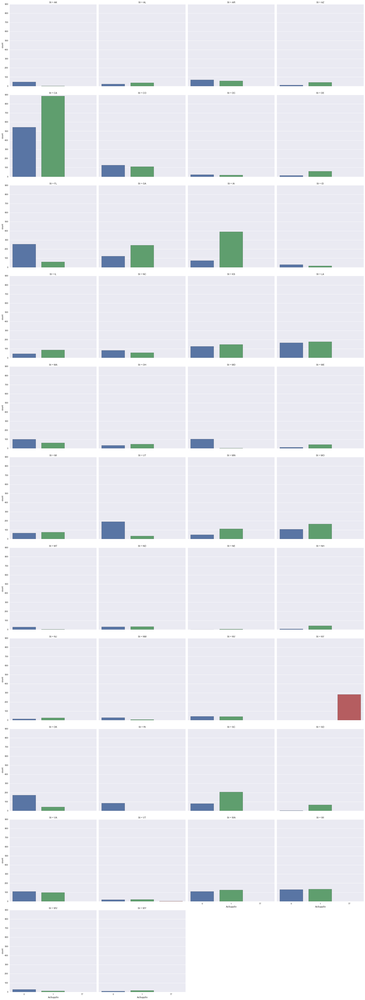

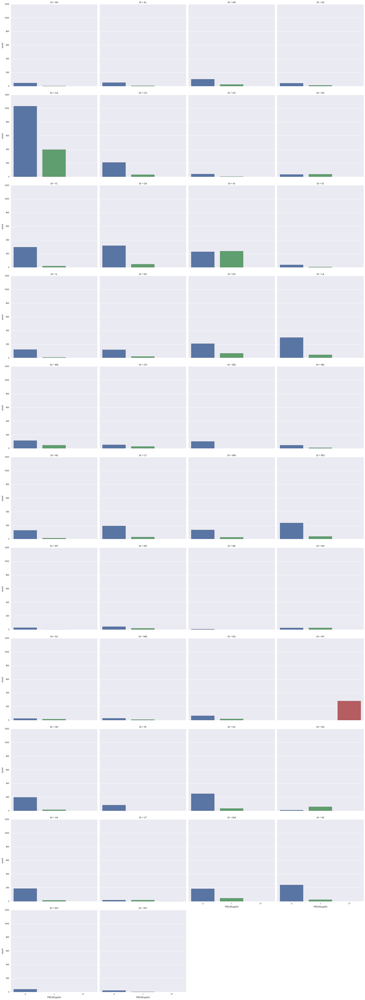

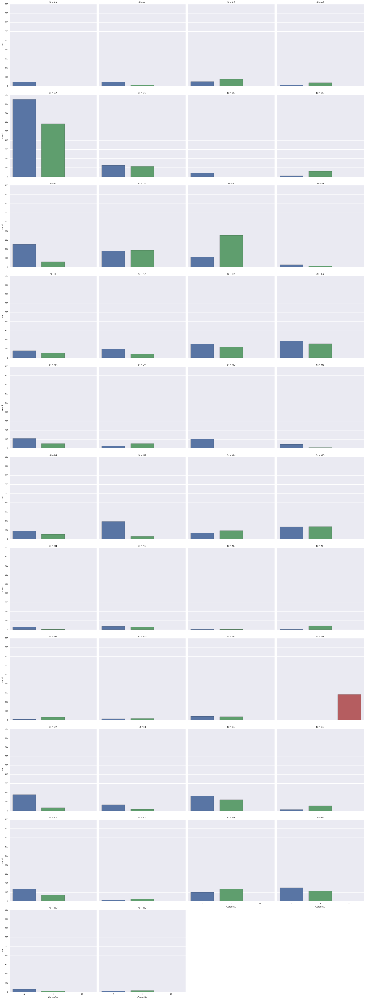

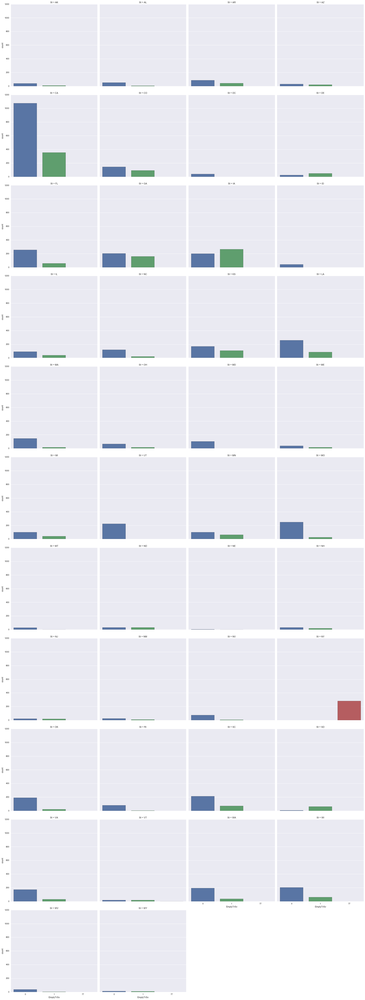

...

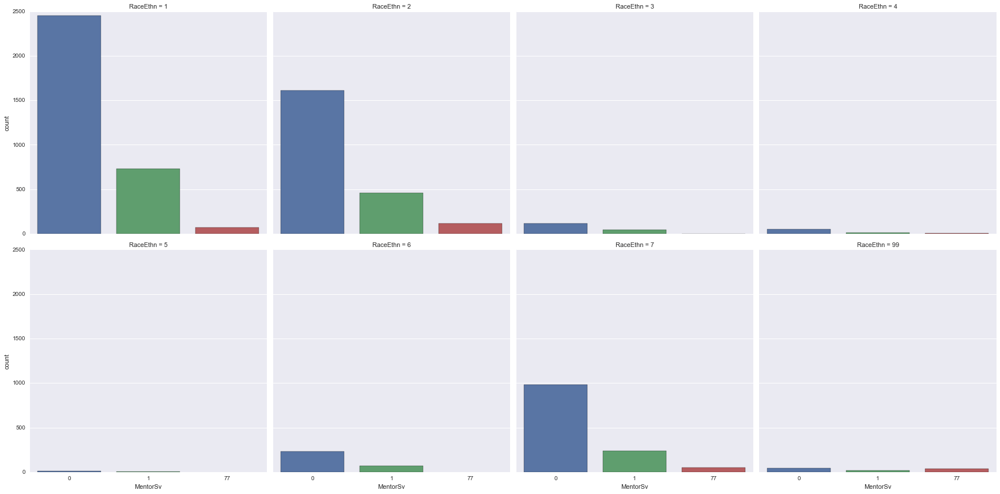

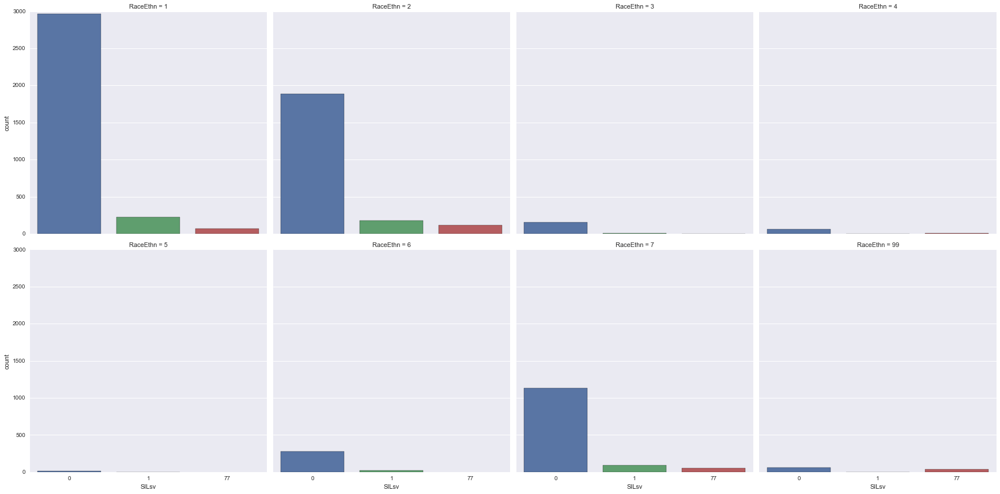

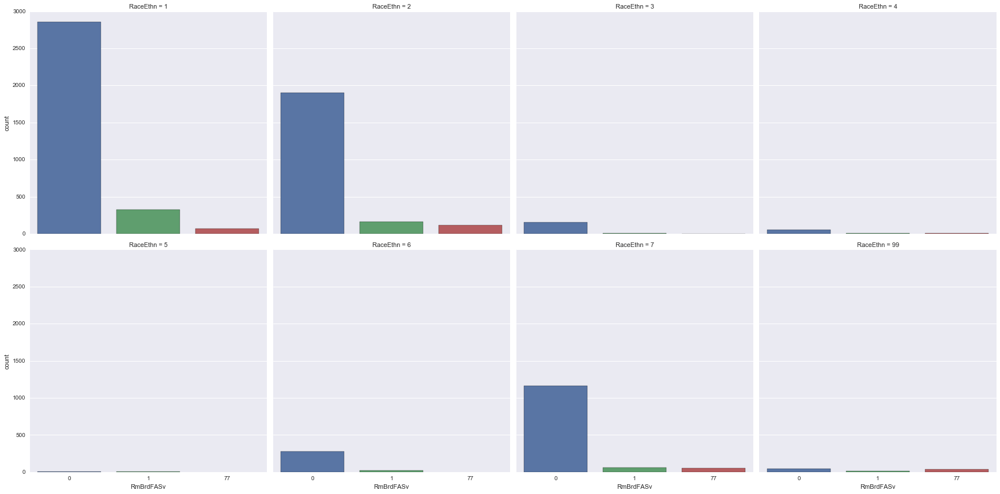

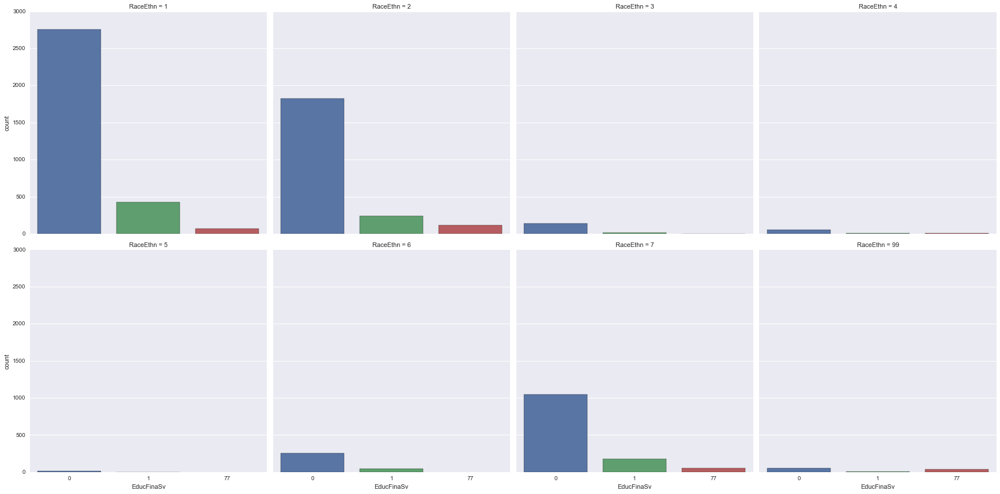

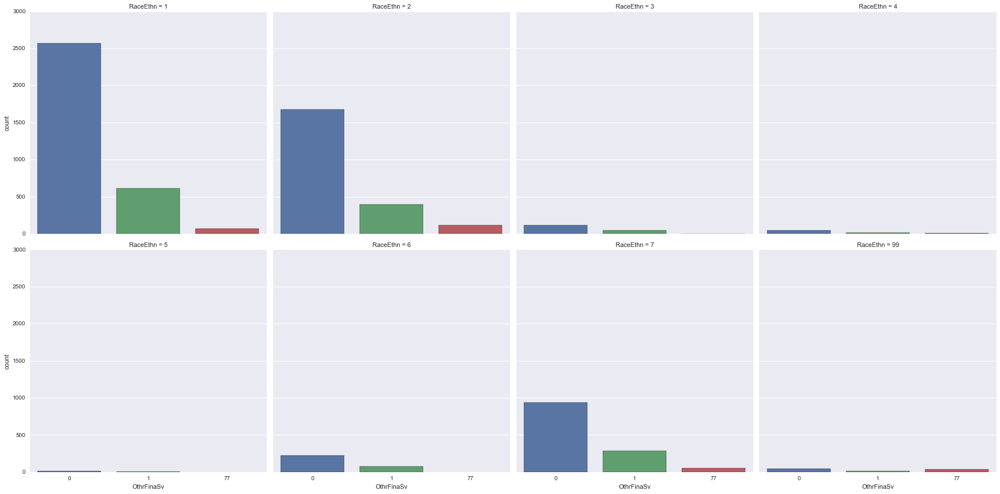

In [142]:
features_sub = features.drop('Num_services',axis=1)

for column in demographics:
    for services in features_sub:
        sns.factorplot(services, col=column, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

##### Hypothesis Testing: Chi^2 Test of Association (aka Test of Independence) between demographic variables and features

For this analysis, I used the 'Table of Chi-square statistics' from: https://www.ma.utexas.edu/users/davis/375/popecol/tables/chisq.html

In [171]:
import html5lib

chi2_stat_table = pd.read_html('http://www.ma.utexas.edu/users/davis/375/popecol/tables/chisq.html')
chi2_stat_table

ImportError: html5lib not found, please install it

In [179]:
import requests
from IPython.core.display import HTML, Image


r = requests.get('https://www.ma.utexas.edu/users/davis/375/popecol/tables/chisq.html')

page_html = r.content

HTML(r.content.decode('utf-8'))


# # DOWNLOAD WEB PAGE CONTENT
# page = rq.urlopen('https://www.ma.utexas.edu/users/davis/375/popecol/tables/chisq.html')
# txtpage = rqpage.read()
# dom = et.HTML(txtpage)

# dom
# # # XPATH EXPRESSIONS TO LISTS (SKIPPING HEADER COLUMN)
# # df= dom.xpath("//table[@class='wikitable']/tr[position()>1]/td[1]/b/text()")
# # p_05 = dom.xpath("//table[@class='wikitable']/tr[position()>1]//td[2]/a/text()")
# # P_01 = dom.xpath("//table[@class='wikitable']/tr[position()>1]//td[3]/a/text()")
# # p_001 = dom.xpath("//table[@class='wikitable']/tr[position()>1]//td[4]/text()")

# # # CONVERT LISTS TO DATA FRAME
# # df = pd.DataFrame({'Abbreviation':abbreviation,
# #                    'State':state,
# #                    'Capital':capital,
# #                    'Incorporated':incorporated})

# # print(df.head())

In [182]:
from bs4 import BeautifulSoup

soup = BeautifulSoup(r.content, "lxml")
print(soup.prettify())


/Users/cguy/anaconda/lib/python2.7/site-packages/bs4/__init__.py:166: UserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("lxml"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

To get rid of this warning, change this:

 BeautifulSoup([your markup])

to this:

 BeautifulSoup([your markup], "lxml")

  markup_type=markup_type))


RuntimeError: maximum recursion depth exceeded in __instancecheck__

In [214]:
from bs4 import BeautifulSoup

import requests

r  = requests.get("https://www.ma.utexas.edu/users/davis/375/popecol/tables/chisq.html")

data = r.text

soup = BeautifulSoup(data)

# for link in soup.find_all('a'):
#     print(link.get('href'))

t.html
f005.html
f001.html
f0001.html


In [ ]:
def extract_location_from_result(soup_file):
    location_col = []
    for d in soup_file.findAll('span', class_='location'):
        entry = d.text
        location_col.append(entry)
    return location_col

def extract_company_from_result(soup_file):
    company_col = []
    for d in soup_file.findAll('span', class_='company'):
        entry = d.text
        company_col.append(entry)
    return company_col

def extract_job_from_result(soup_file):
    job_col = []
    for result in soup_file.findAll('a', {'data-tn-element' : re.compile('job.*')}):
        entry = result.text
        job_col.append(entry)
    return job_col

def extract_salary_from_result(soup_file):
    salary_col = []
    for result in soup_file.findAll('div', {'class' : re.compile('row.*')}):
        sal = result.findAll('nobr')
        if len(sal) > 0 :
            rstring = str(sal)
            salary_col.append(rstring)
        else:
            salary_col.append(np.nan)
    return salary_col

In [ ]:
def build_jobpost_db(soup_file):

    company = extract_company_from_result(soup_file) 
    job = extract_job_from_result(soup_file)
    location = extract_location_from_result(soup_file)
    salary = extract_salary_from_result(soup_file)
    sponsored = mark_sponsored(soup_file)
    
    jobdf = pd.DataFrame({'Job' : job, 'Company' : company, 'Location' : location, 'Salary' : salary, 'Sponsored' : \
                                                                                          sponsored})
    
    return jobdf

In [ ]:
build_jobpost_db(i_soup)

In [244]:
# data

for tr in soup.find_all('tr')[1:]:
    tds = tr.find_all('td')
    vals1 = tds[0].text #, tds[1].text, tds[2].text
    print vals1

# vals1

1		3.84		6.64		10.83
2		5.99		9.21		13.82
3		7.82		11.35		16.27
4		9.49		13.28		18.47
5		11.07		15.09		20.52
6		12.59		16.81		22.46
7		14.07		18.48		24.32
8		15.51		20.09		26.13
9		16.92		21.67		27.88
10		18.31		23.21		29.59
11		19.68		24.73		31.26
12		21.03		26.22		32.91
13		22.36		27.69		34.53
14		23.69		29.14		36.12
15		25.00		30.58		37.70
16		26.30		32.00		39.25
17		27.59		33.41		40.79
18		28.87		34.81		42.31
19		30.14		36.19		43.82
20		31.41		37.57		45.32
21		32.67		38.93		46.80
22		33.92		40.29		48.27
23		35.17		41.64		49.73
24		36.42		42.98		51.18
25		37.65		44.31		52.62
26		38.89		45.64		54.05
27		40.11		46.96		55.48
28		41.34		48.28		56.89
29		42.56		49.59		58.30
30		43.77		50.89		59.70
31		44.99		52.19		61.10
32		46.19		53.49		62.49
33		47.40		54.78		63.87
34		48.60		56.06		65.25
35		49.80		57.34		66.62
36		51.00		58.62		67.99
37		52.19		59.89		69.35
38		53.38		61.16		70.71
39		54.57		62.43		72.06
40		55.76		63.69		73.41
41		56.94		64.95		74.75
42		58.12		66.21		76.09
43		59.

In [275]:
# First creating a class to automate the Chi Squared Test of Association for my analysis. 

class test_of_ass:
    
    def __init__(self, var1, var2):
        self.var1 = var1
        self.var2 = var2
        
    def hypoStatements(self):

        null_hypothesis = 'H0: Distributions of {} DO NOT differ based on {} of foster youth.'.format(self.var2, self.var1)
        alt_hypothesis = 'HA: Distributions of {} DO differ based on {} of foster youth.'.format(self.var2, self.var1)
        sig_lvl = 'Significance Level = 0.01'
        return null_hypothesis, alt_hypothesis, sig_lvl
    
    def crosstab(self):
        
        cross_tab = pd.crosstab(self.var1, self.var2)
        return cross_tab
    
    def chi2_tool(self):
        
        chi2_tool = chi2_contingency(self.crosstab())
        stats = ['chi2_float', 'p_value', 'dof', 'ExpFreq_array']

        dict_result = dict(zip(stats, chi2_tool))
        return dict_result
            
        
    def print_results(self):
        
        results_dict = self.chi2_tool()
        p_val = results_dict['p_value']
        
        if p_val > 0.01:
            print "P-value is greater than significance level. Therefore, the null hypothesis can NOT be rejected."
        else:
            print "P-value is less than significance level. Therefore, the null hypothesis CAN be rejected."
            
        return "p-value: " + str(p_val)
        
        
        
#         'Degrees of Freedom: {}'.format()
#         if 
        
#         'The computed value of the test statistic is {}.'.format()
        
        
        
#         alt_hypothesis = 'HA: Distributions of {} DO differ based on {} of foster youth.'.format(self.var2, self.var1)
#         return dof
#         return chi2_stat
        
#  is 5.347

# Step 5. Reject H0, the computed test statistic is too high. 


In [276]:
test_1 = test_of_ass(demographics['Sex'], features_sub['ILNAsv'])

print test_1.crosstab()
print test_1.chi2_tool()
print test_1.print_results()


ILNAsv    0     1    77
Sex                    
1       1543  1945  133
2       1561  2022  150
{'chi2_float': 0.91463691772917599, 'ExpFreq_array': array([[ 1528.36333968,  1953.291678  ,   139.34498232],
       [ 1575.63666032,  2013.708322  ,   143.65501768]]), 'dof': 2, 'p_value': 0.63297873027450002}
P-value is greater than significance level. Therefore, the null hypothesis can NOT be rejected.
p-value: 0.632978730275


In [280]:
# def apply_test(var_list1, var_list2):

for demos in demographics:
    for servs in features_sub:

        test_1 = test_of_ass(demographics[demos], features_sub[servs])

        print test_1.crosstab()
        print test_1.chi2_tool()
        print test_1.print_results()
        print
        print

ILNAsv   0    1    77
St                   
AK       14   32    0
AL       56    2    0
AR       49   76    0
AZ       21   31    0
CA      769  660    0
CO      174   63    0
DC       39    0    0
DE       30   41    0
FL      127  186    0
GA      128  235    0
IA       85  378    0
ID       10   33    0
IL       99   32    0
KS       89  185    0
LA       32  310    0
MA      116   46    0
MD       70   34    0
ME       38   17    0
MI       72   68    0
MN       83   77    0
MO       52  219    0
MT        1   29    0
NC       93   45    0
ND       26   37    0
NE        3    3    0
NH       19   30    0
NJ       31   10    0
NM       19   16    0
NV       49   33    0
NY        0    0  282
OH        3   78    0
OK      121   91    0
RI       15   68    0
SC      196   88    0
SD       55   13    0
UT       29  193    0
VA      137   67    0
VT       14   24    1
WA      120  113    0
WI        5  258    0
WV        9   29    0
WY        6   17    0
{'chi2_float': 8797.325609969775

In [ ]:
# def apply_test(var_list1, var_list2):

demo_wout_NY = demographics[demographics['St']]!='NY'
delin_without_77 = delin_without_77[delin_without_77!=77]
ilna_without_77 = features_sub['ILNAsv']
ilna_without_77 = ilna_without_77[ilna_without_77!=77]

for demos in demographics:
    for servs in features_sub:

        test_1 = test_of_ass(demographics[demos], features_sub[servs])

        print test_1.crosstab()
        print test_1.chi2_tool()
        print test_1.print_results()
        print
        print

In [266]:
# First I will remove blanks from the data to improve accuracy of hypothesis testing. 
# There are different ways to address the blanks in data for hypothesis testing. 
# I am choosing to just remove them from the hypothesis testing altogether.

demos_for_HT = demographics[demographics['St']!='NY']
servs_for_HT = features_sub[features_sub['ILNAsv']!=77]
servs_for_HT = features_sub[features_sub['AcSuppSv']!=77]
servs_for_HT = features_sub[features_sub['PSEdSuppSv']!=77]
servs_for_HT = features_sub[features_sub['CareerSv']!=77]
servs_for_HT = features_sub[features_sub['EmplyTrSv']!=77]
servs_for_HT = features_sub[features_sub['BudgetSv']!=77]
servs_for_HT = features_sub[features_sub['HousEdSv']!=77]
servs_for_HT = features_sub[features_sub['HlthEdSv']!=77]
servs_for_HT = features_sub[features_sub['FamSuppSv']!=77]
servs_for_HT = features_sub[features_sub['MentorSv']!=77]
servs_for_HT = features_sub[features_sub['SILsv']!=77]
servs_for_HT = features_sub[features_sub['RmBrdFASv']!=77]
servs_for_HT = features_sub[features_sub['EducFinaSv']!=77]
servs_for_HT = features_sub[features_sub['OthrFinaSv']!=77]


# delin_without_77 = demographics['DelinqntSv']
# delin_without_77 = delin_without_77[delin_without_77!=77]
# ilna_without_77 = features_sub['ILNAsv']
# ilna_without_77 = ilna_without_77[ilna_without_77!=77]

In [267]:
demos_for_HT
servs_for_HT

,ILNAsv,AcSuppSv,PSEdSuppSv,CareerSv,EmplyTrSv,BudgetSv,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv
0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,0,0,1,1
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1
6,1,0,0,0,0,0,1,1,0,0,0,0,0,1
7,1,0,0,0,0,0,0,0,0,0,0,0,0,1
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [269]:
for demo in demographics:
    for services in features_sub:
#         print zip(demo,services)
        test_1 = test_of_ass(demographics[demo], features_sub[services])

        print test_1.crosstab()
        print test_1.chi2_tool()
#         print demo
#         print services

ILNAsv   0    1    77
St                   
AK       14   32    0
AL       56    2    0
AR       49   76    0
AZ       21   31    0
CA      769  660    0
CO      174   63    0
DC       39    0    0
DE       30   41    0
FL      127  186    0
GA      128  235    0
IA       85  378    0
ID       10   33    0
IL       99   32    0
KS       89  185    0
LA       32  310    0
MA      116   46    0
MD       70   34    0
ME       38   17    0
MI       72   68    0
MN       83   77    0
MO       52  219    0
MT        1   29    0
NC       93   45    0
ND       26   37    0
NE        3    3    0
NH       19   30    0
NJ       31   10    0
NM       19   16    0
NV       49   33    0
NY        0    0  282
OH        3   78    0
OK      121   91    0
RI       15   68    0
SC      196   88    0
SD       55   13    0
UT       29  193    0
VA      137   67    0
VT       14   24    1
WA      120  113    0
WI        5  258    0
WV        9   29    0
WY        6   17    0
{'chi2_float': 8797.325609969775

In [254]:
# delinq vs ILNA

# delin_ilna = test_of_ass(demographics['DelinqntSv'], features_sub['ILNAsv'])

# test_of_ass.hypoStatements(delin_ilna, demographics['DelinqntSv'], features_sub['ILNAsv'])

# for demo in demographics:
#     for services in features_sub:
#         d_f_pair = test_of_ass(demo, services)

#         print test_of_ass.hypoStatements(d_f_pair)


In [220]:
delin_ilna = test_of_ass(demographics['DelinqntSv'], features_sub['ILNAsv'])

test_of_ass.chi2_tool(delin_ilna)


{'ExpFreq_array': array([[ 2410.09518629,  3080.16997552,   219.73483818],
        [  574.45526244,   734.1701115 ,    52.37462605],
        [  119.44955126,   152.65991297,    10.89053576]]),
 'chi2_float': 7407.0013706305745,
 'dof': 4,
 'p_value': 0.0}

In [147]:
# for column in demographics:
#     for services in features_sub:
#         print column
#         print services
#         chi2_tool = chi2_contingency(pd.crosstab(demographics[column], features_sub[services]))
#         chi2_tool

ti = pd.crosstab(demographics['DelinqntSv'], features_sub['ILNAsv'])

chi2_tool = chi2_contingency(pd.crosstab(demographics['DelinqntSv'], features_sub['ILNAsv']))

for i in chi2_tool:
    print i

    { _key : _value(_key) for _key in _container }


7407.00137063
0.0
4
[[ 2410.09518629  3080.16997552   219.73483818]
 [  574.45526244   734.1701115     52.37462605]
 [  119.44955126   152.65991297    10.89053576]]


In [153]:
# users[users!=0]


delin_without_77 = demographics['DelinqntSv']
delin_without_77 = delin_without_77[delin_without_77!=77]
ilna_without_77 = features_sub['ILNAsv']
ilna_without_77 = ilna_without_77[ilna_without_77!=77]

In [148]:
ti

ILNAsv,0,1,77
DelinqntSv,,,
0,2624,3086,0
1,480,881,0
77,0,0,283


In [154]:
ti = pd.crosstab(delin_without_77, ilna_without_77)

chi2_tool = chi2_contingency(ti)

for i in chi2_tool:
    print i

50.5287565513
1.17431447451e-12
1
[[ 2506.5535285  3203.4464715]
 [  597.4464715   763.5535285]]


In [160]:
list_result = []
stats = ['chi2_float', 'p_value', 'dof', 'ExpFreq_array']

for result in chi2_tool:
    list_result.append(result)

list_result

for result in list_result
dict_result = { stat : result(stat) for stat in stats }
dict_result

[50.528756551349026,
 1.1743144745069665e-12,
 1,
 array([[ 2506.5535285,  3203.4464715],
        [  597.4464715,   763.5535285]])]

In [170]:
stats = ['chi2_float', 'p_value', 'dof', 'ExpFreq_array']

dict_result = dict(zip(stats, chi2_tool))

dict_result

{'ExpFreq_array': array([[ 2506.5535285,  3203.4464715],
        [  597.4464715,   763.5535285]]),
 'chi2_float': 50.528756551349026,
 'dof': 1,
 'p_value': 1.1743144745069665e-12}

In [155]:
ti

ILNAsv,0,1
DelinqntSv,,
0,2624,3086
1,480,881


In [121]:
# Number of Services by demographics

# # Create column for number of services received in demo table

def add_tally(row):
    return 1    

services_count = features.T

demo_sub = demographics.copy()
demo_sub['Num_services'] = (services_count == 1).sum()

# Functions for plots of num_services by demo

def set_piv_tab(col):
    demo_i = demo_sub[[col,'Num_services']]
    demo_i['Freq_count'] = demo_i[col].apply(add_tally)
    piv_tab = demo_i.pivot_table(index=['Num_services',col], values='Freq_count', aggfunc=np.sum)
    piv_tab = piv_tab.reset_index()
    
    return piv_tab

def create_ns_plot(col, pivot_table):
    sns.pairplot(pivot_table, hue=col, kind='scatter', diag_kind='hist', size=10)

In [122]:
set_piv_tab('EdLevlSv')

/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Num_services,EdLevlSv,Freq_count
0,0,9,1
1,0,10,4
2,0,11,1
3,0,77,283
4,2,0,29
5,2,6,20
6,2,7,46
7,2,8,210
8,2,9,557
9,2,10,905


/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


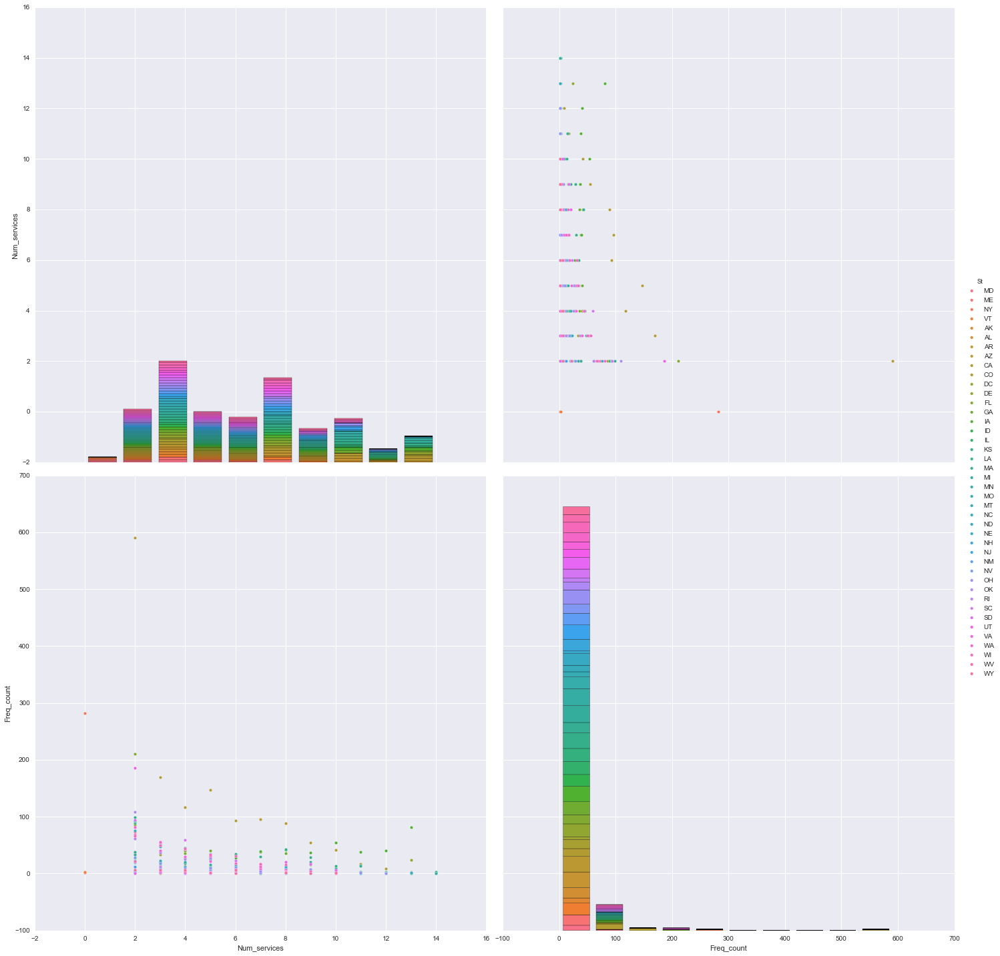

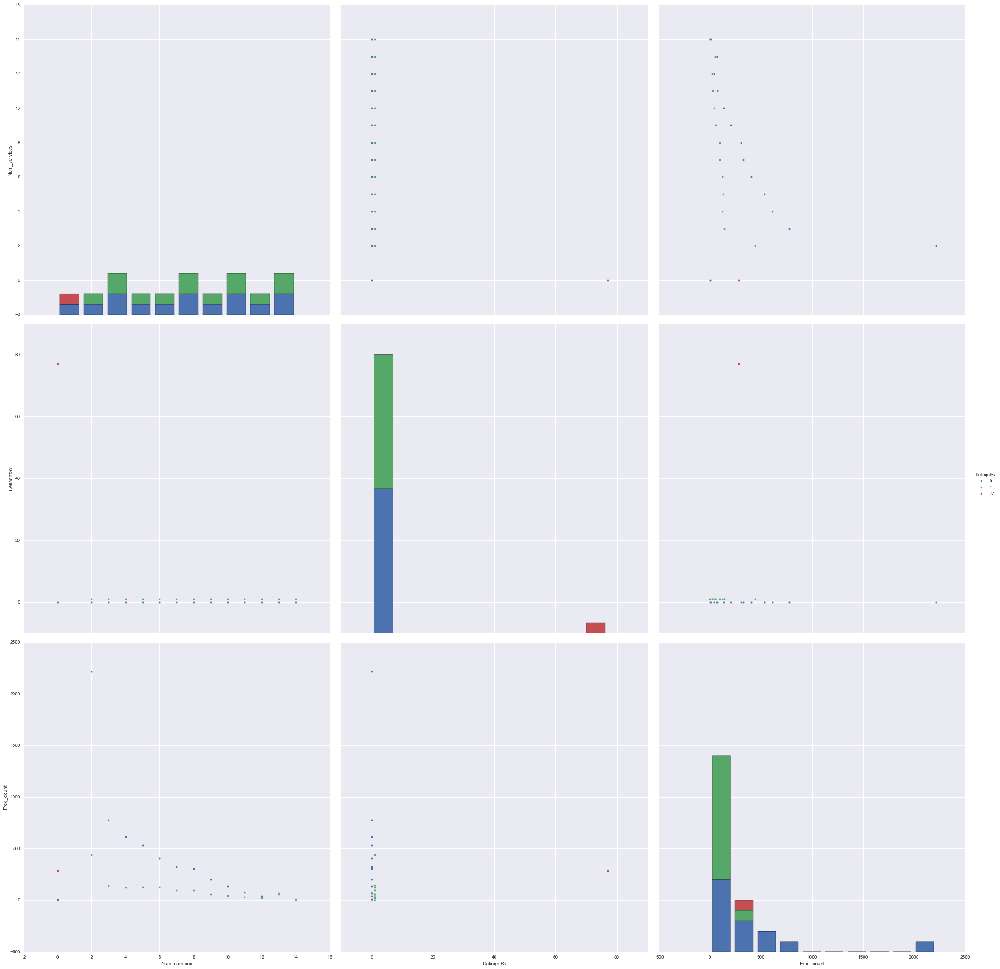

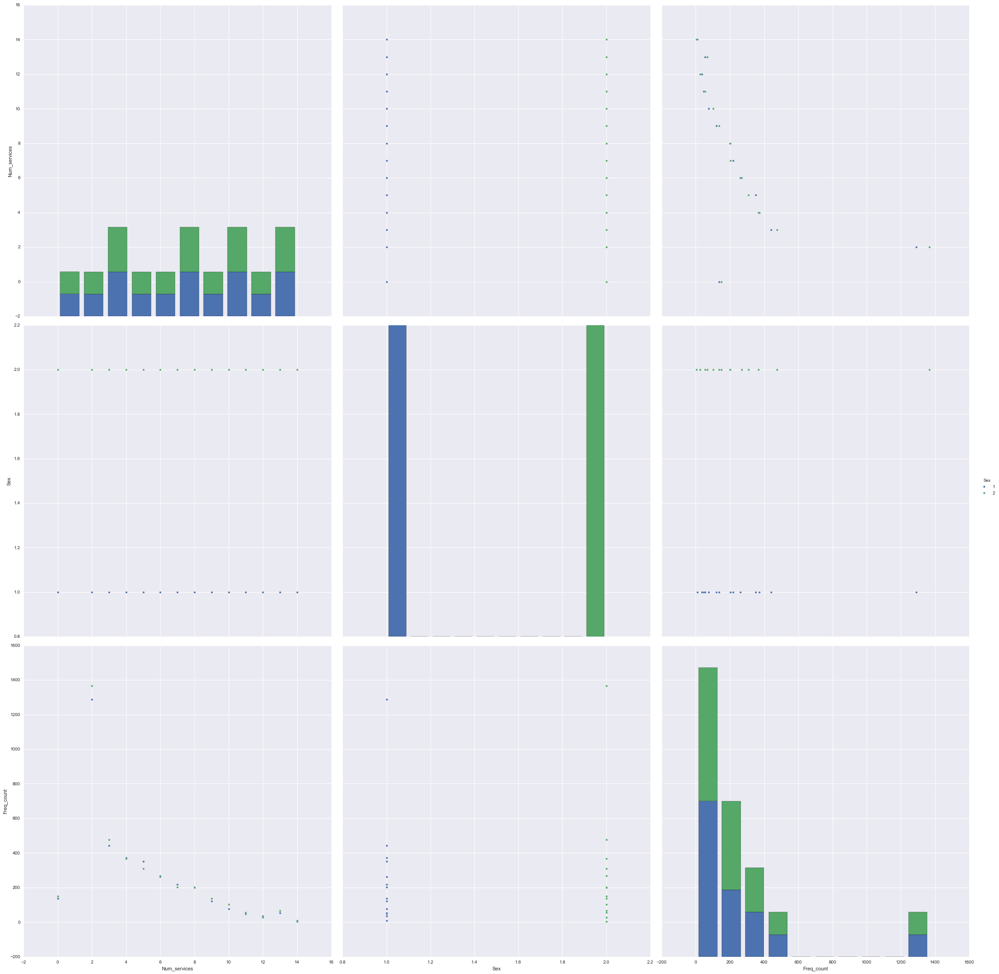

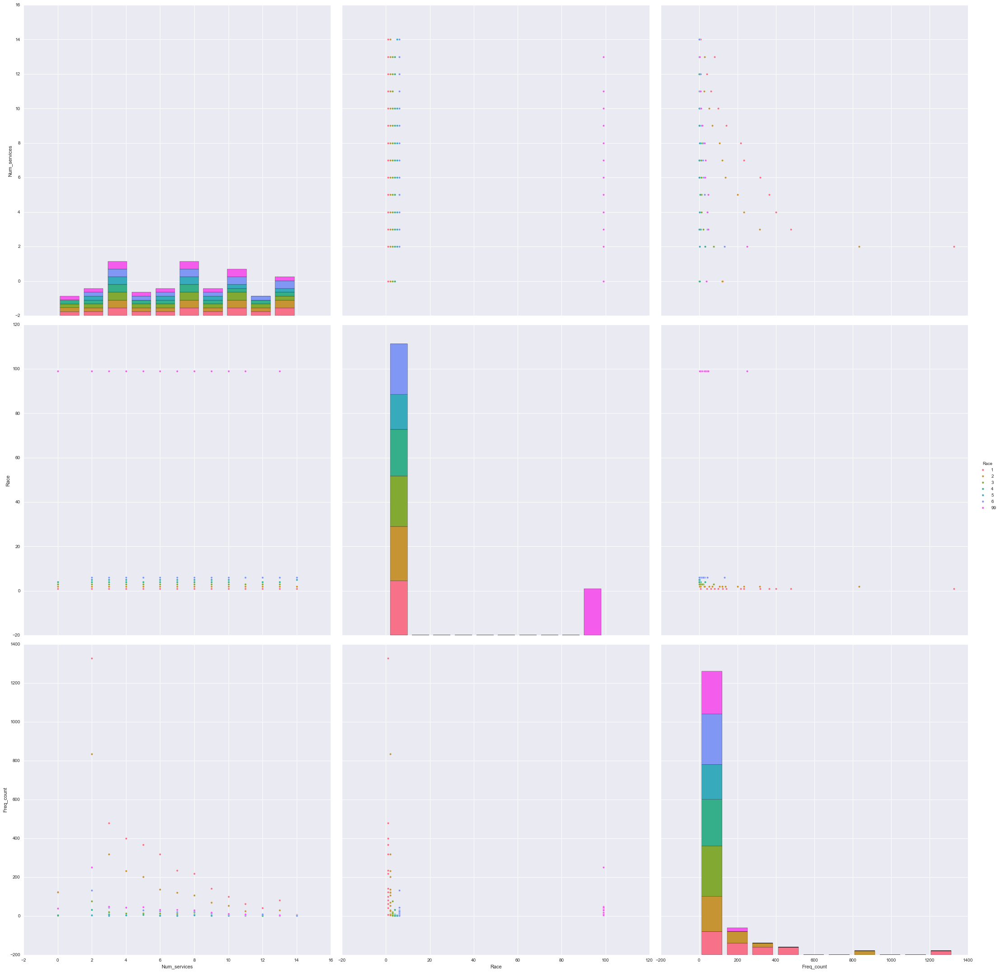

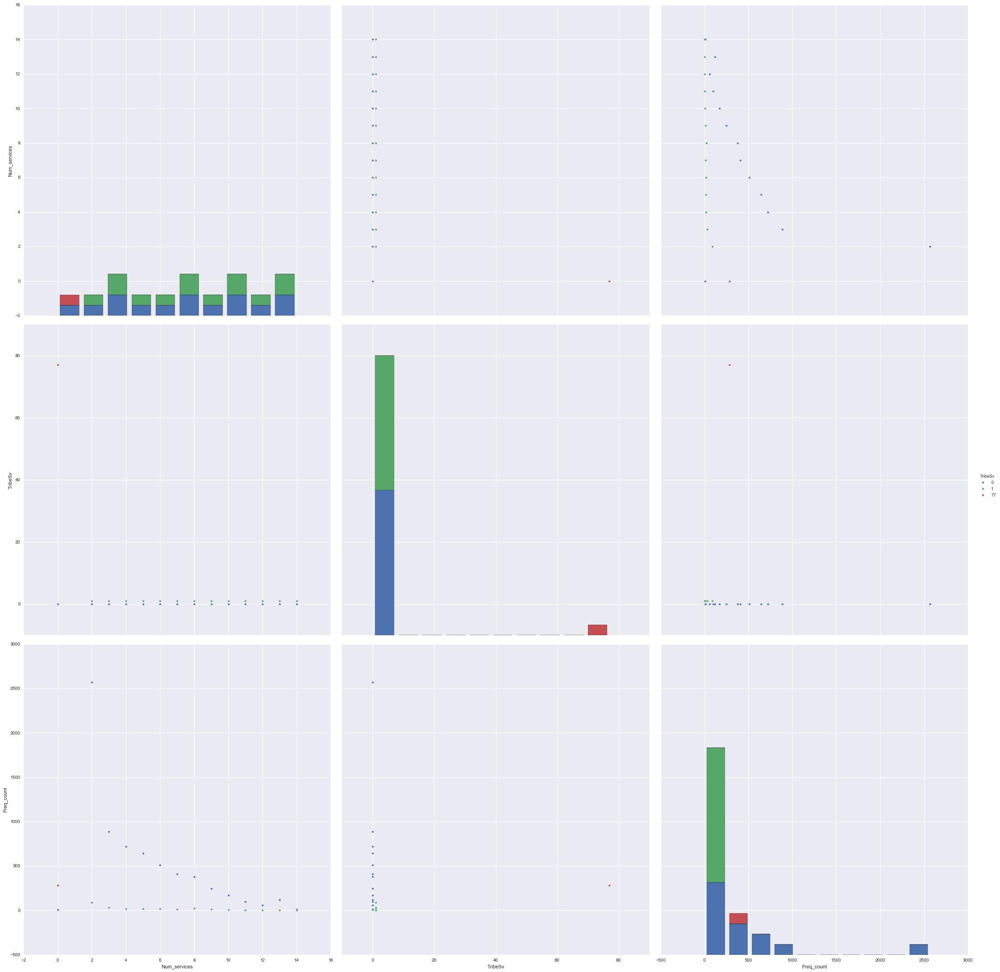

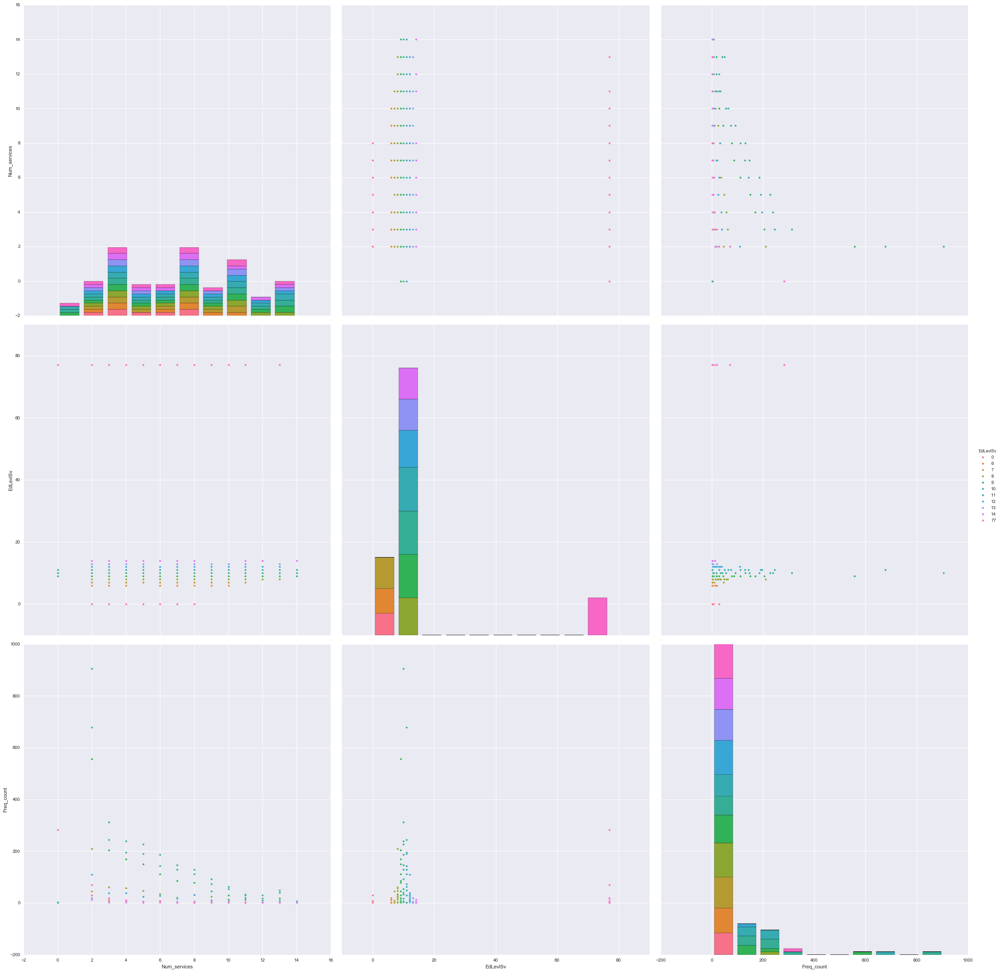

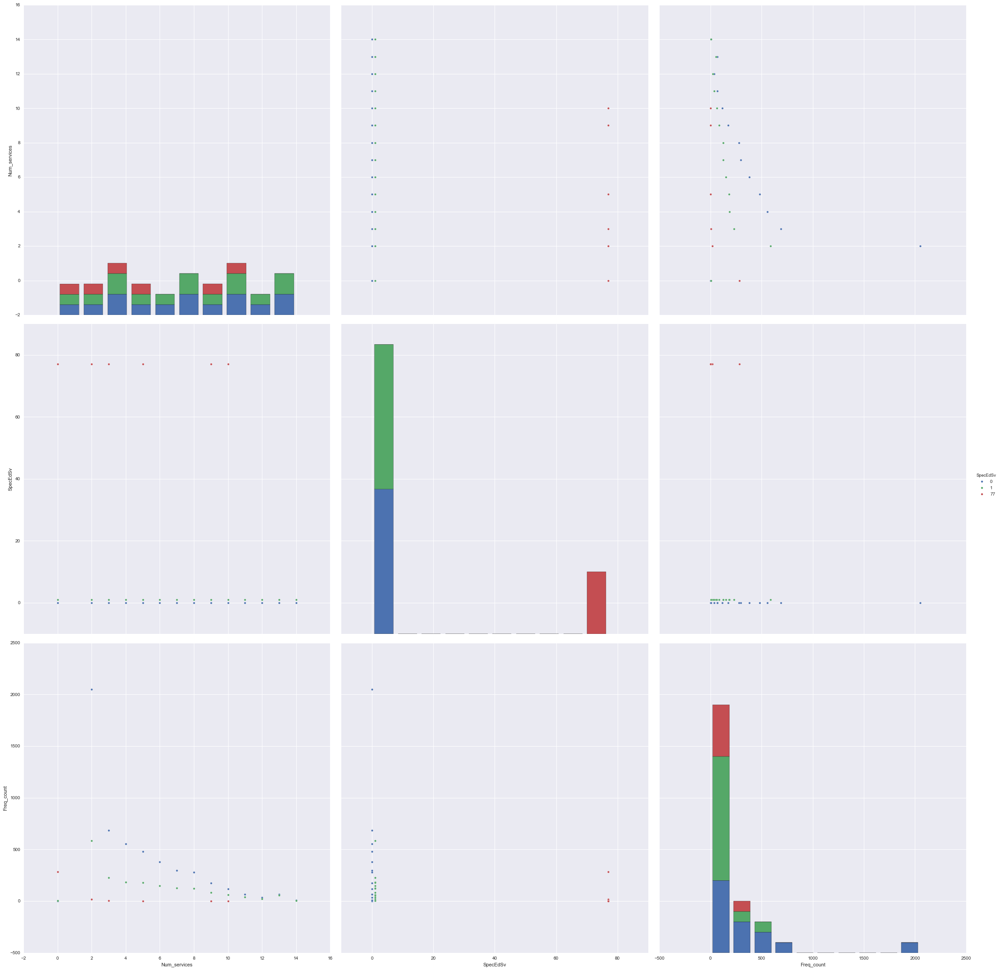

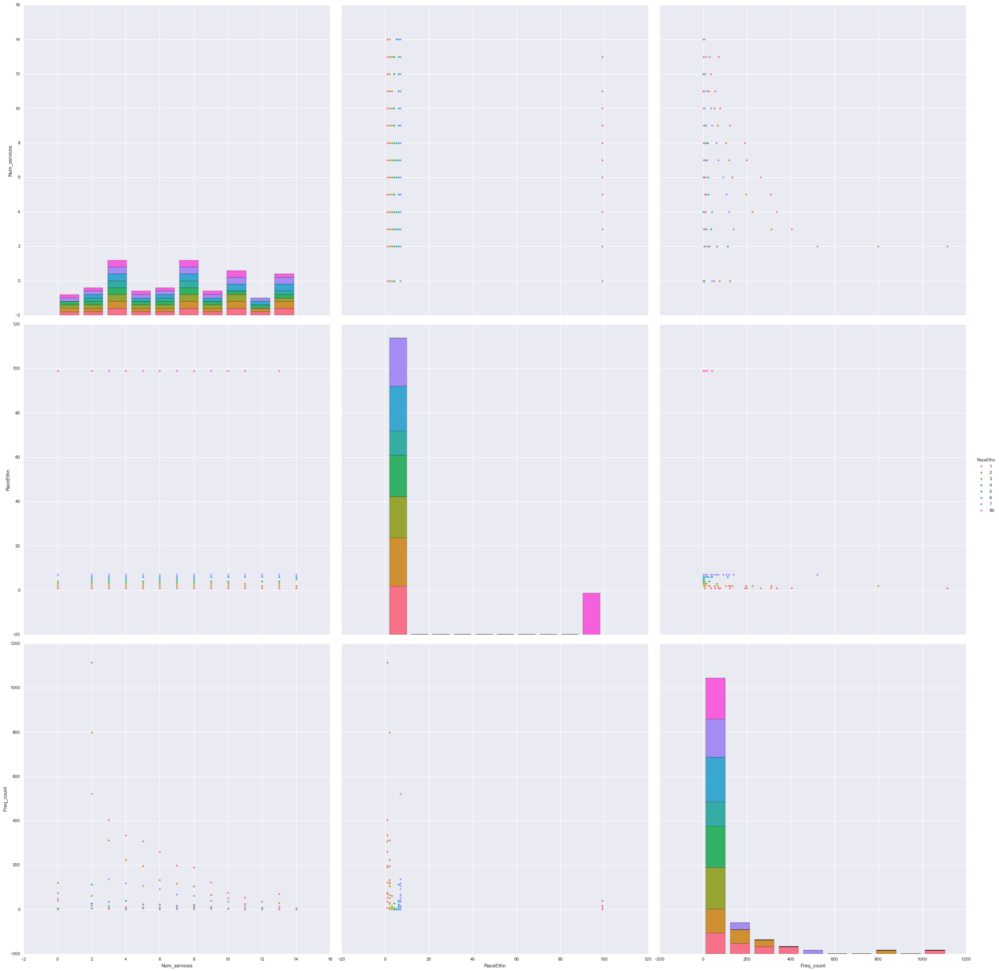

In [123]:
for col in demographics:
    create_ns_plot(col, set_piv_tab(col))


St
PubFoodAs
St
PubHousAs
St
OthrFinAs
St
HighEdCert
St
CurrFTE
St
CurrPTE
St
PubFinAs
St
CurrenRoll
St
PrescripIn
St
Homeless
St
SubAbuse
St
Incarc
St
Medicaid
St
CnctAdult
St
EmplySklls
St
OthrHlthIn
St
MedicalIn
St
MentlHlthIn
DelinqntSv
PubFoodAs
DelinqntSv
PubHousAs
DelinqntSv
OthrFinAs
DelinqntSv
HighEdCert
DelinqntSv
CurrFTE
DelinqntSv
CurrPTE
DelinqntSv
PubFinAs
DelinqntSv
CurrenRoll
DelinqntSv
PrescripIn
DelinqntSv
Homeless
DelinqntSv
SubAbuse
DelinqntSv
Incarc
DelinqntSv
Medicaid
DelinqntSv
CnctAdult
DelinqntSv
EmplySklls
DelinqntSv
OthrHlthIn
DelinqntSv
MedicalIn
DelinqntSv
MentlHlthIn
Sex
PubFoodAs
Sex
PubHousAs
Sex
OthrFinAs
Sex
HighEdCert
Sex
CurrFTE
Sex
CurrPTE
Sex
PubFinAs
Sex
CurrenRoll
Sex
PrescripIn
Sex
Homeless
Sex
SubAbuse
Sex
Incarc
Sex
Medicaid
Sex
CnctAdult
Sex
EmplySklls
Sex
OthrHlthIn
Sex
MedicalIn
Sex
MentlHlthIn
Race
PubFoodAs
Race
PubHousAs
Race
OthrFinAs
Race
HighEdCert
Race
CurrFTE
Race
CurrPTE
Race
PubFinAs
Race
CurrenRoll
Race
PrescripIn
Race
Homeless
R

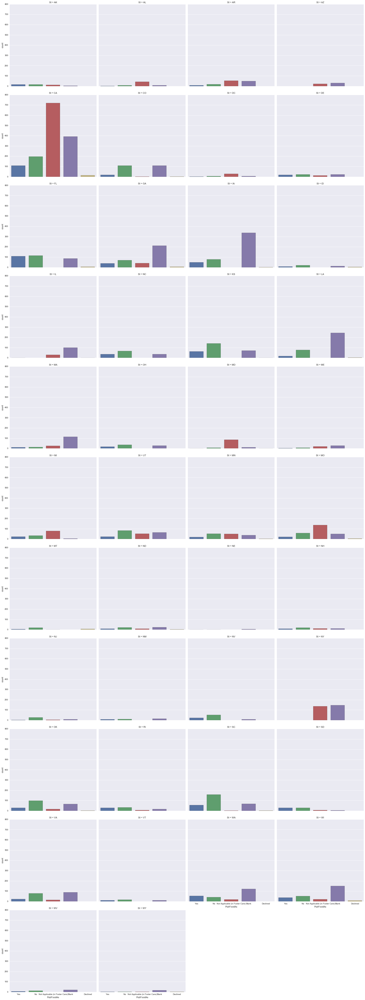

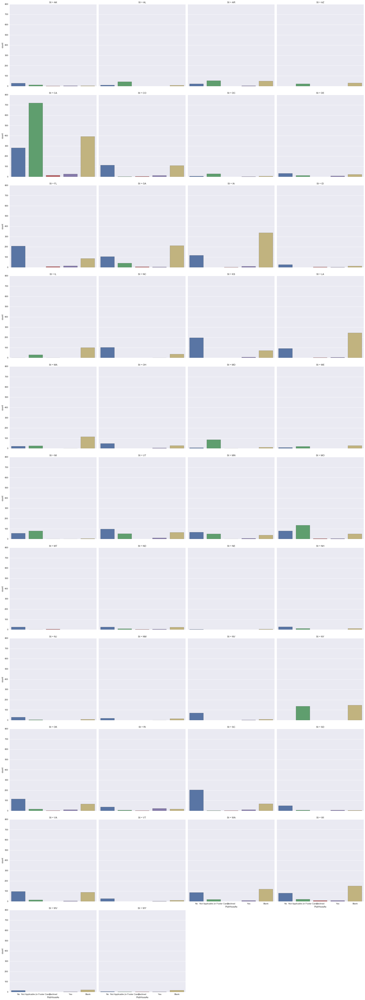

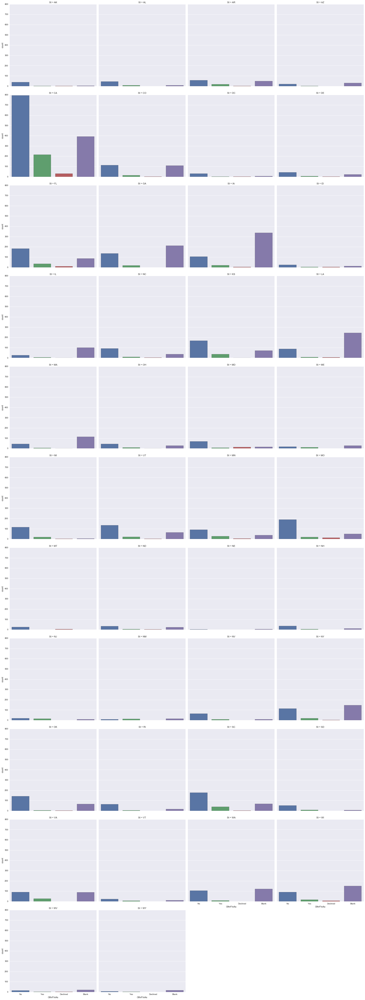

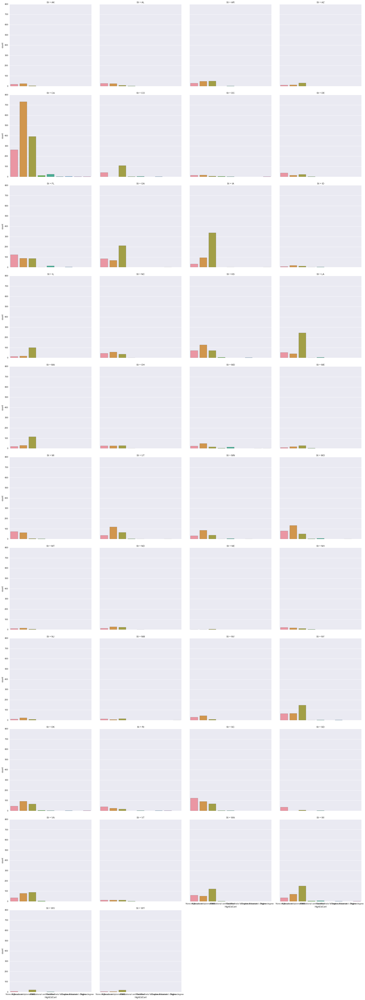

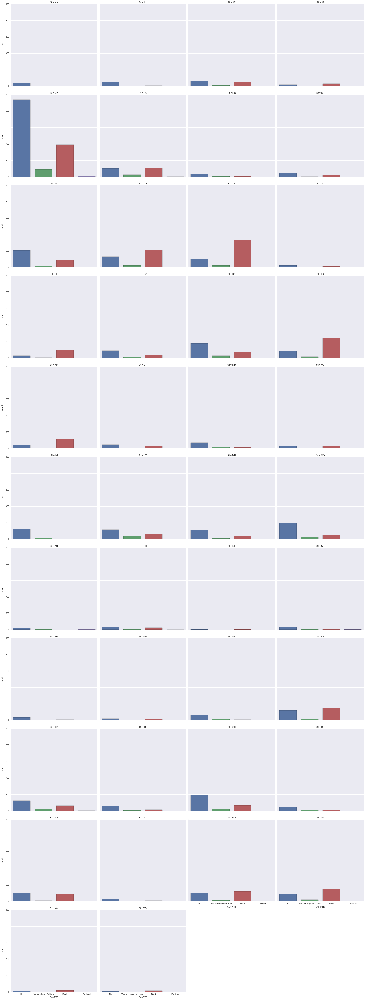

...

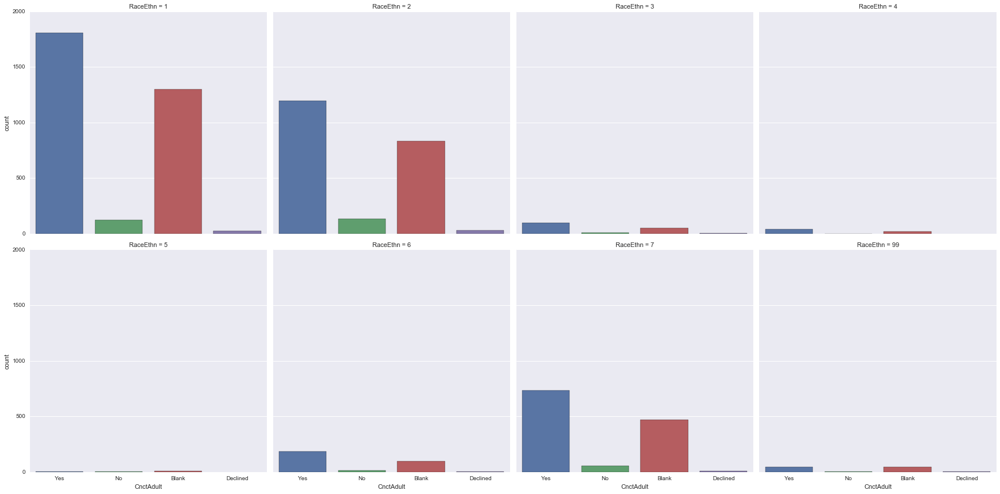

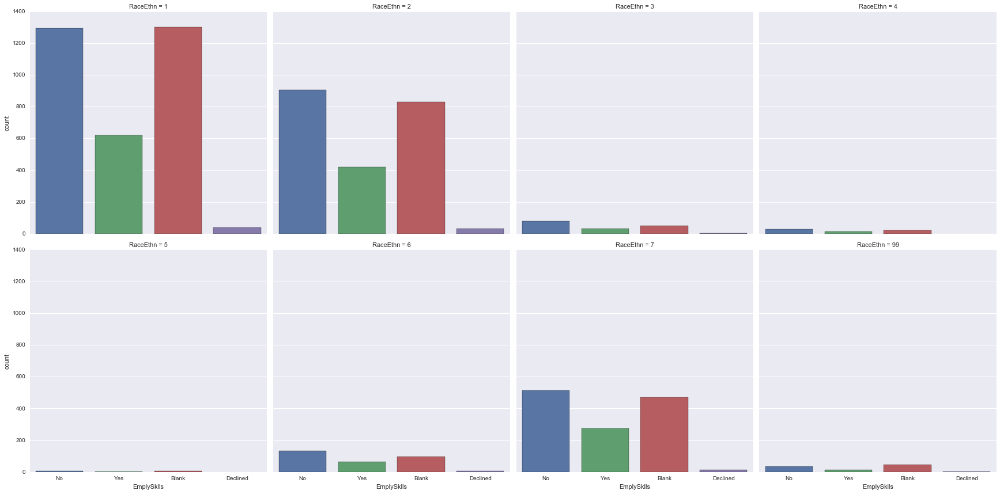

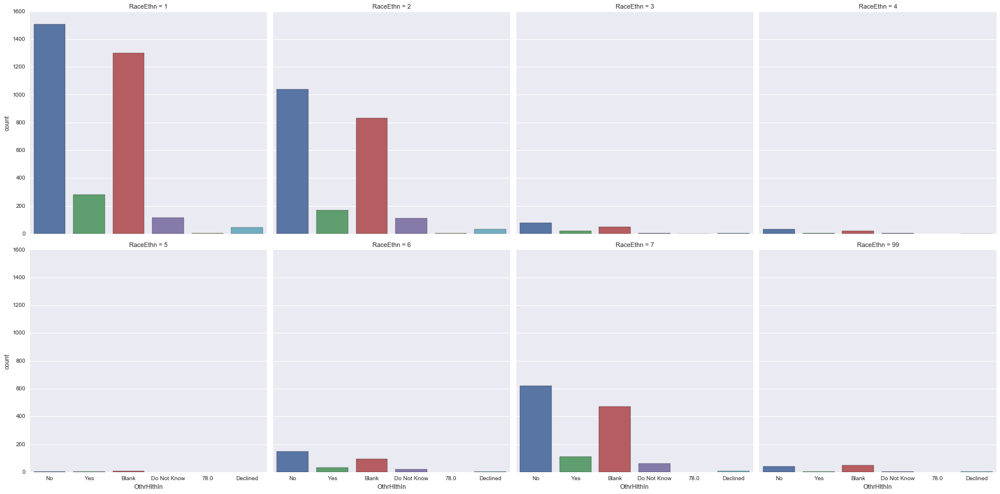

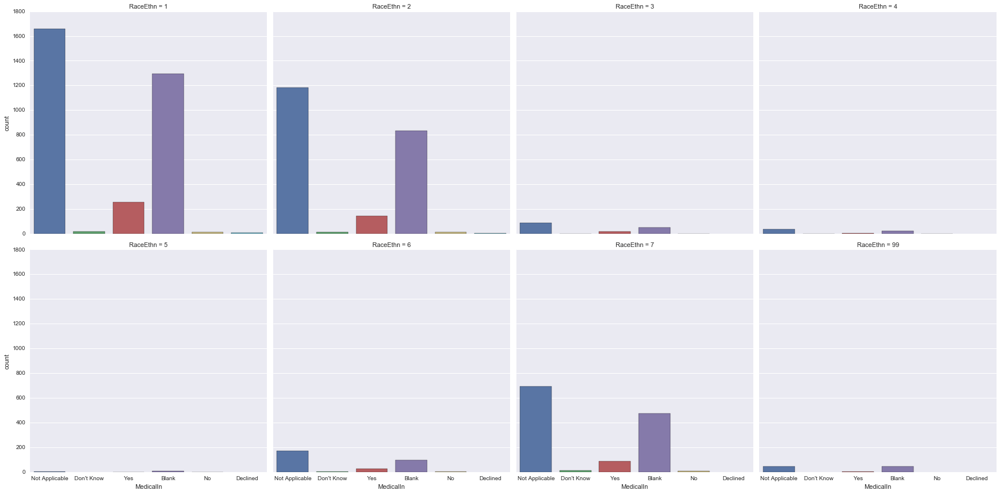

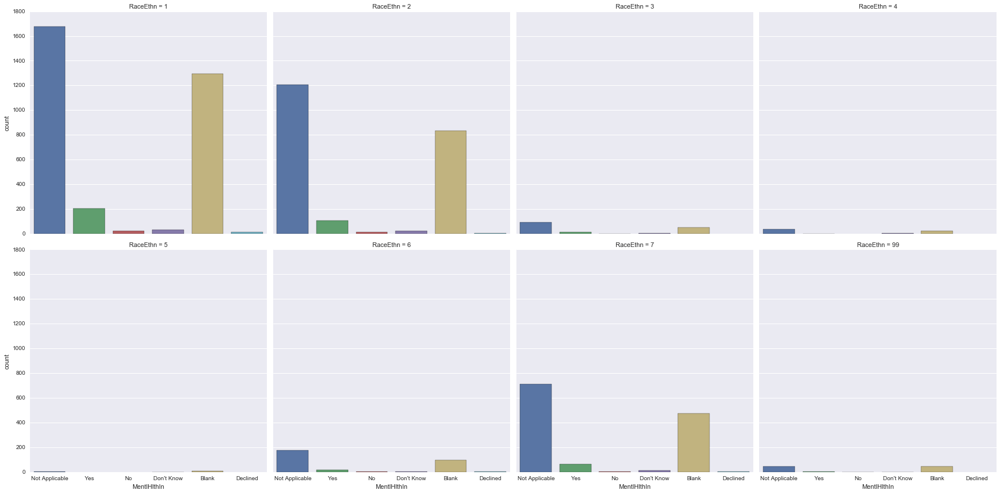

In [124]:
# Demographics by Targets

for column in demographics:
    for outcomes in targets:
        print column
        print outcomes
        sns.factorplot(outcomes, col=column, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

ILNAsv
PubFoodAs
ILNAsv
PubHousAs
ILNAsv
OthrFinAs
ILNAsv
HighEdCert
ILNAsv
CurrFTE
ILNAsv
CurrPTE
ILNAsv
PubFinAs
ILNAsv
CurrenRoll
ILNAsv
PrescripIn
ILNAsv
Homeless
ILNAsv
SubAbuse
ILNAsv
Incarc
ILNAsv
Medicaid
ILNAsv
CnctAdult
ILNAsv
EmplySklls
ILNAsv
OthrHlthIn
ILNAsv
MedicalIn
ILNAsv
MentlHlthIn
AcSuppSv
PubFoodAs
AcSuppSv
PubHousAs
AcSuppSv
OthrFinAs
AcSuppSv
HighEdCert
AcSuppSv
CurrFTE
AcSuppSv
CurrPTE
AcSuppSv
PubFinAs
AcSuppSv
CurrenRoll
AcSuppSv
PrescripIn
AcSuppSv
Homeless
AcSuppSv
SubAbuse
AcSuppSv
Incarc
AcSuppSv
Medicaid
AcSuppSv
CnctAdult
AcSuppSv
EmplySklls
AcSuppSv
OthrHlthIn
AcSuppSv
MedicalIn
AcSuppSv
MentlHlthIn
PSEdSuppSv
PubFoodAs
PSEdSuppSv
PubHousAs
PSEdSuppSv
OthrFinAs
PSEdSuppSv
HighEdCert
PSEdSuppSv
CurrFTE
PSEdSuppSv
CurrPTE
PSEdSuppSv
PubFinAs
PSEdSuppSv
CurrenRoll
PSEdSuppSv
PrescripIn
PSEdSuppSv
Homeless
PSEdSuppSv
SubAbuse
PSEdSuppSv
Incarc
PSEdSuppSv
Medicaid
PSEdSuppSv
CnctAdult
PSEdSuppSv
EmplySklls
PSEdSuppSv
OthrHlthIn
PSEdSuppSv
MedicalIn
PSEdSuppS

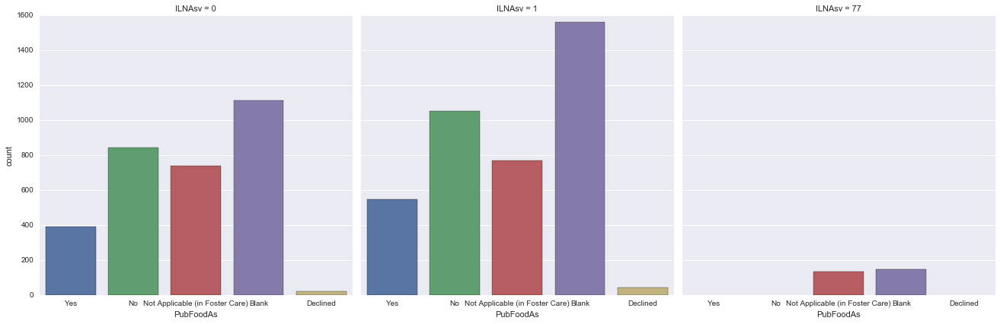

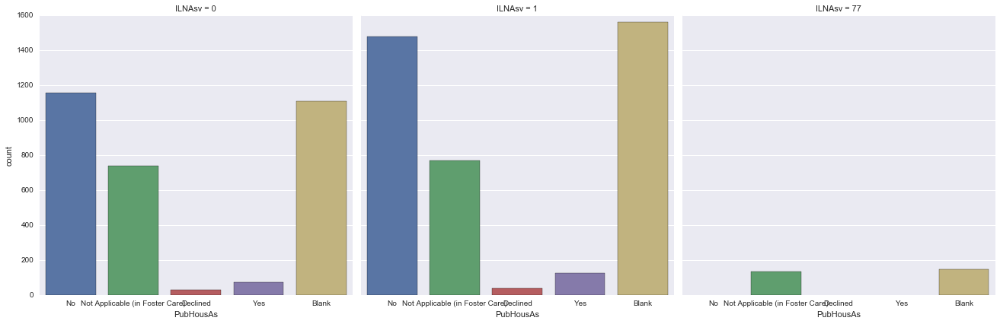

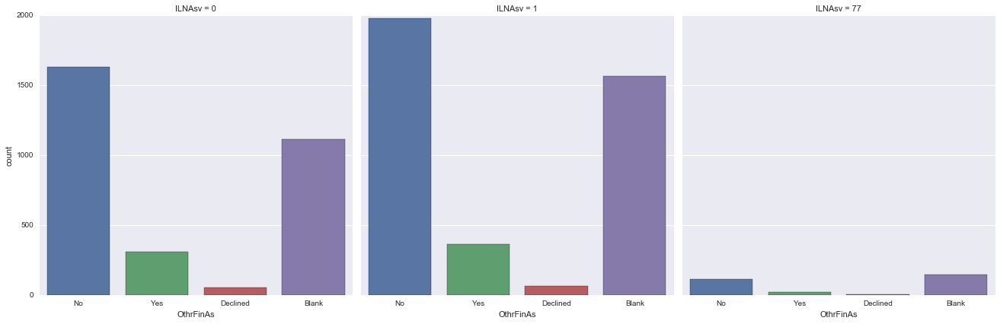

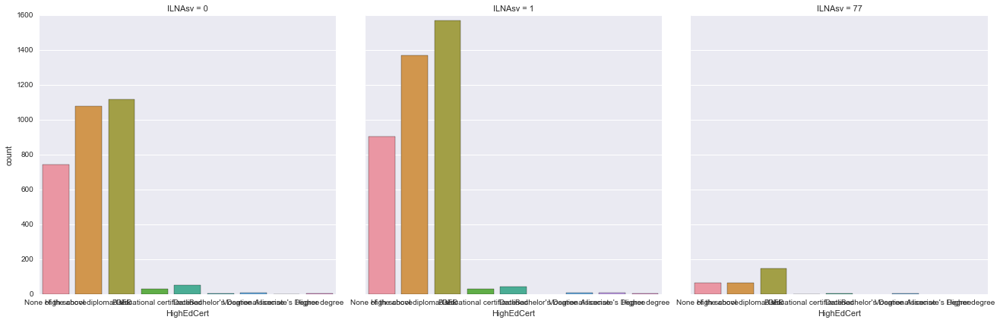

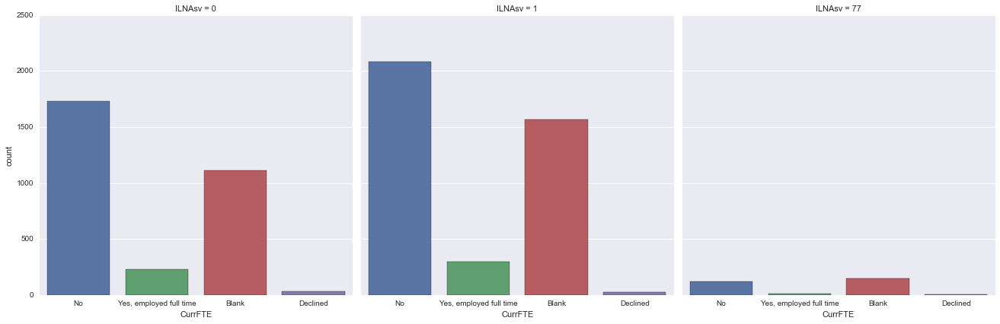

...

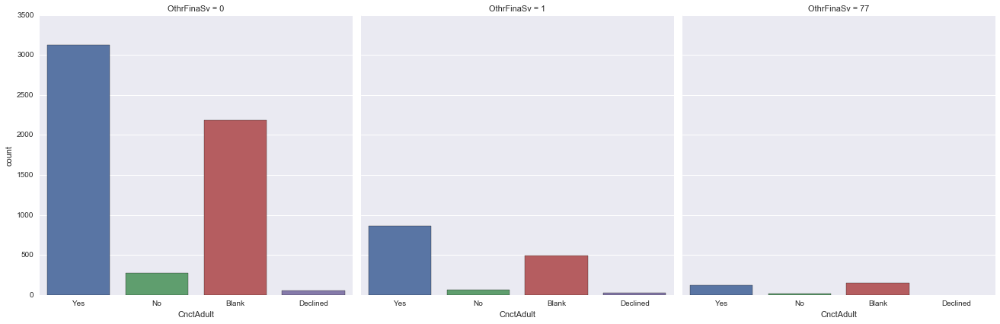

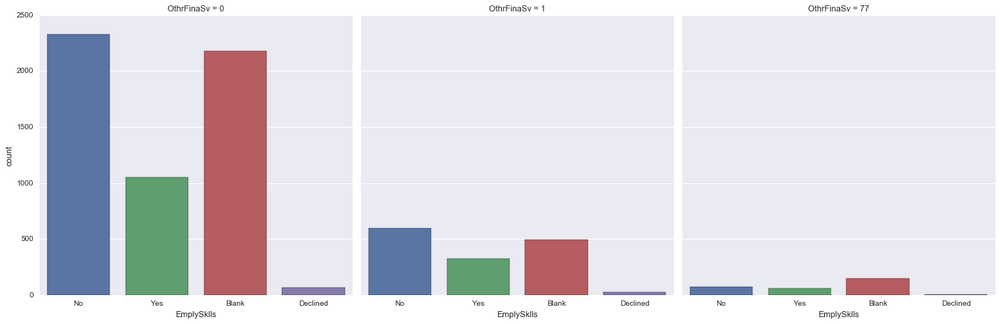

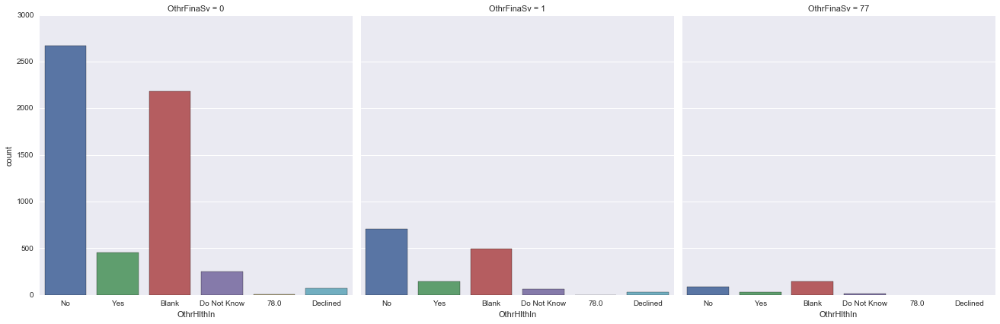

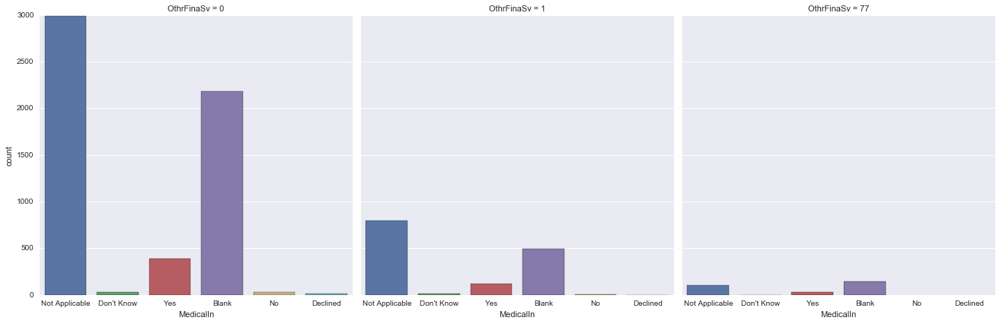

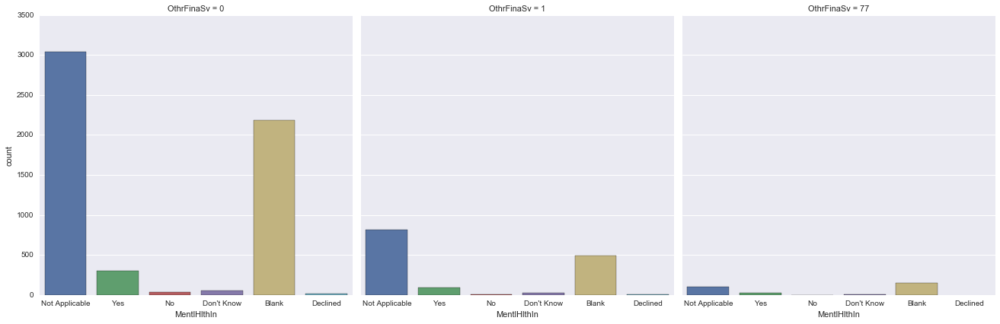

In [125]:
# Features by Targets

for services in features_sub:
    for outcomes in targets:
        print services
        print outcomes
        sns.factorplot(outcomes, col=services, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

In [126]:
# Number of Services by targets

# # Create column for number of services received in targets table

targ_sub = targets.copy()
targ_sub['Num_services'] = (services_count == 1).sum()

# Functions for plots of num_services by targ

def set_piv_tab_t(col):
    targ_i = targ_sub[[col,'Num_services']]
    targ_i['Freq_count'] = targ_i[col].apply(add_tally)
    piv_tab = targ_i.pivot_table(index=['Num_services',col], values='Freq_count', aggfunc=np.sum)
    piv_tab = piv_tab.reset_index()
    
    return piv_tab


/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


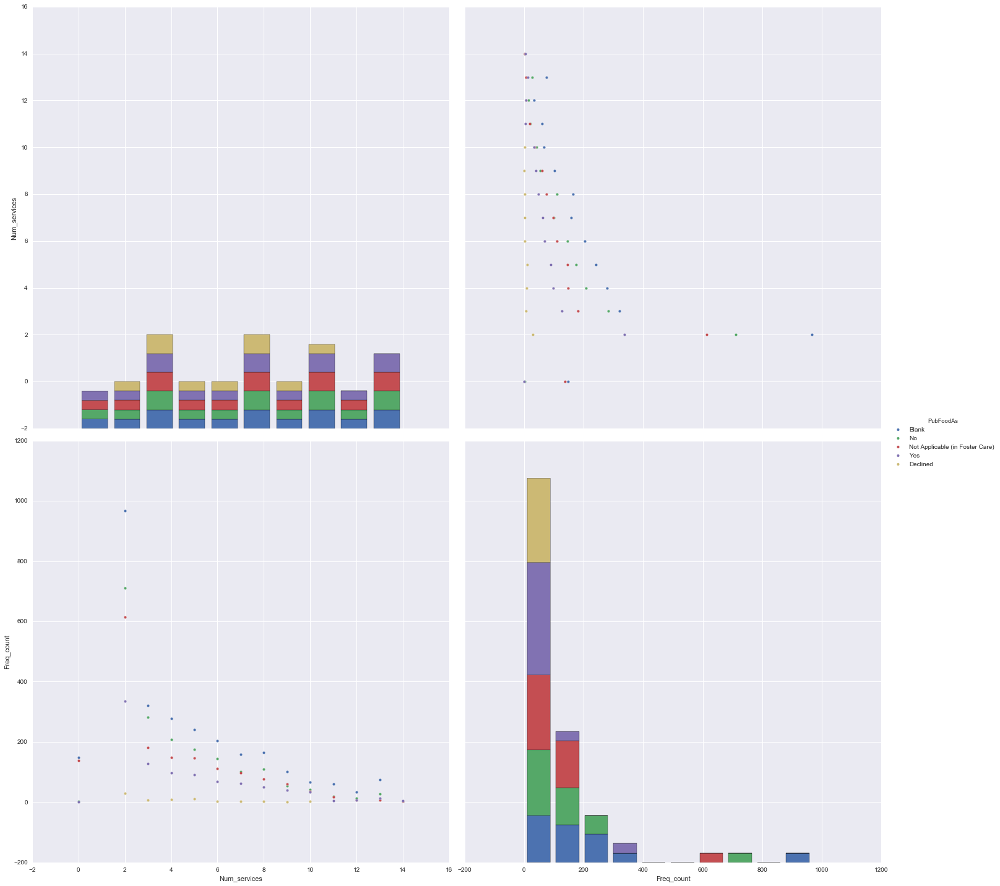

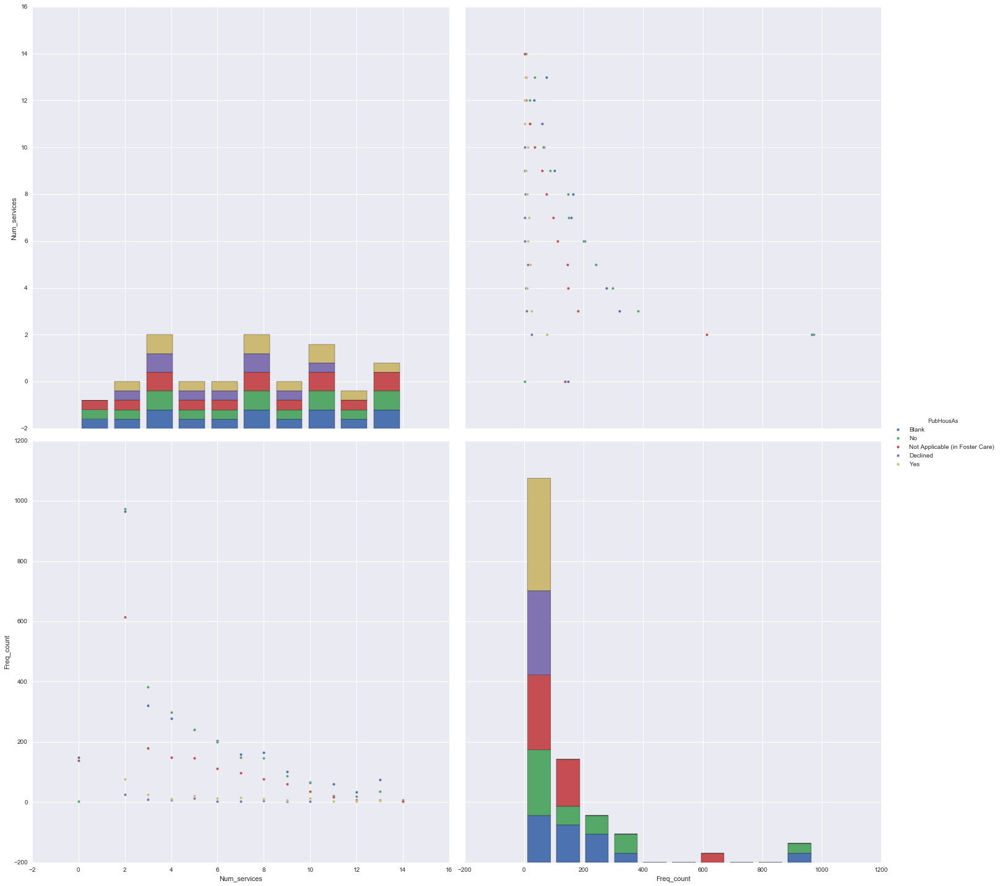

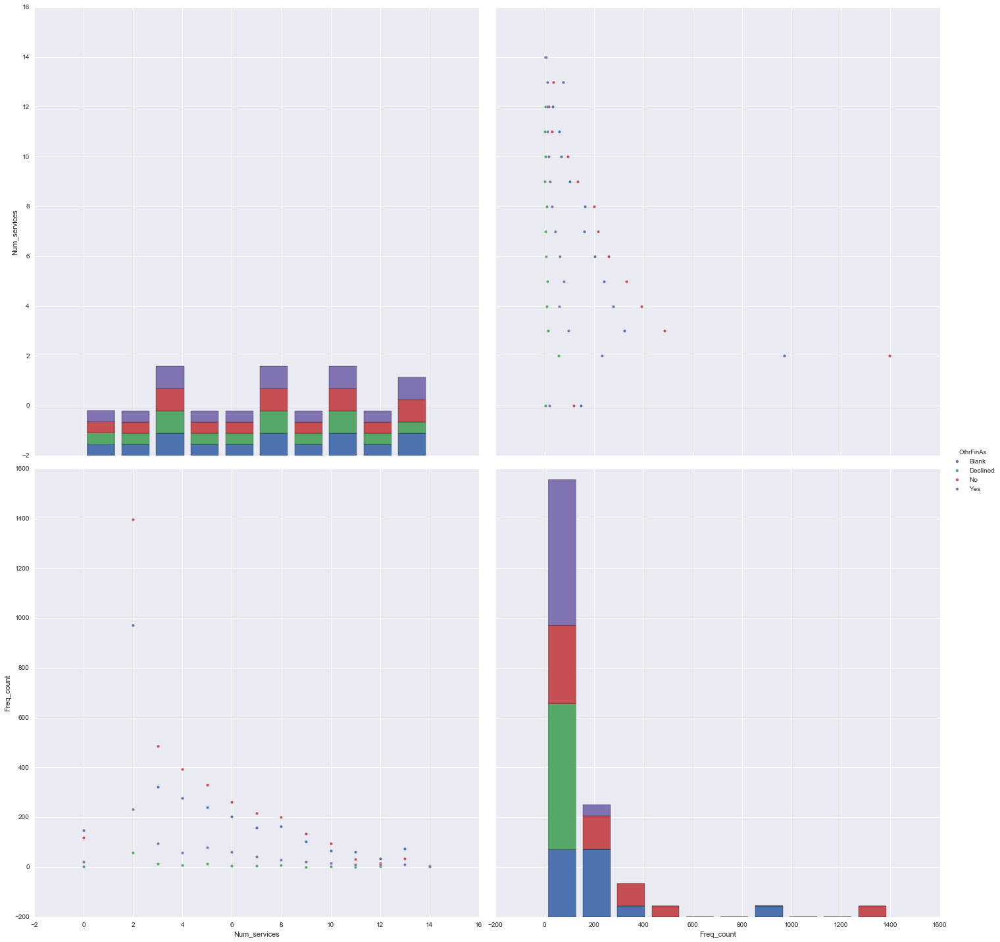

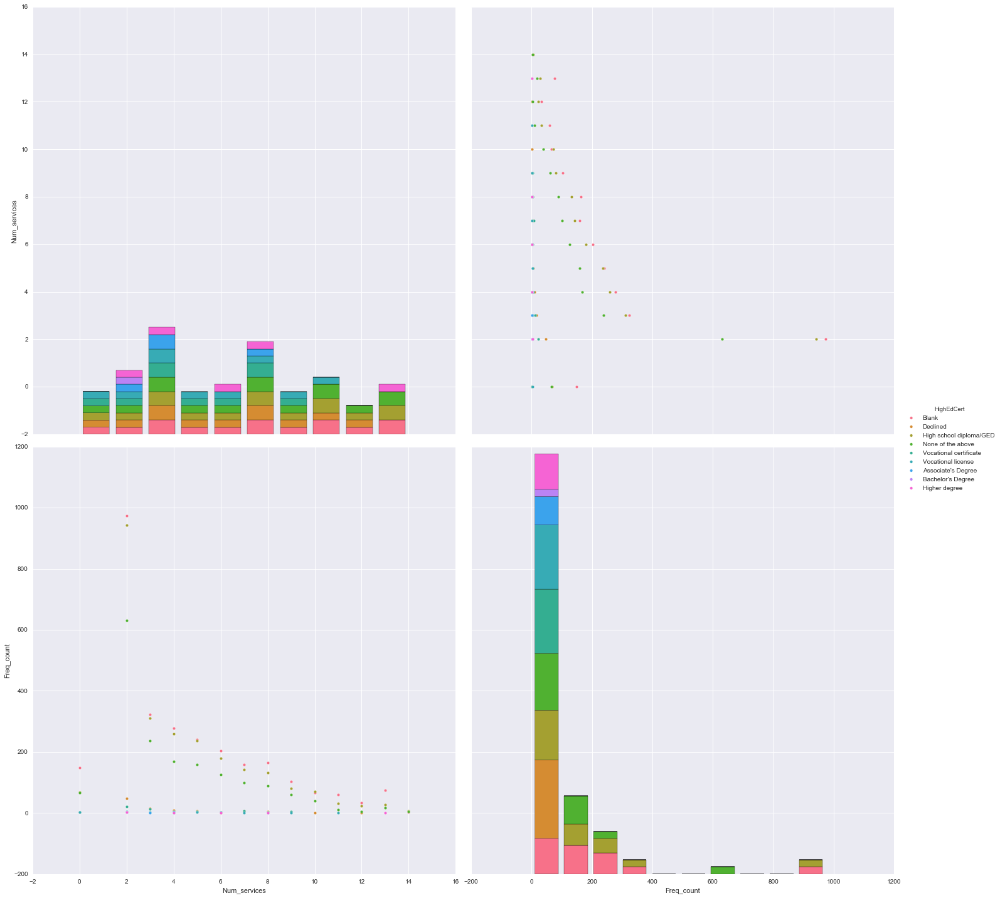

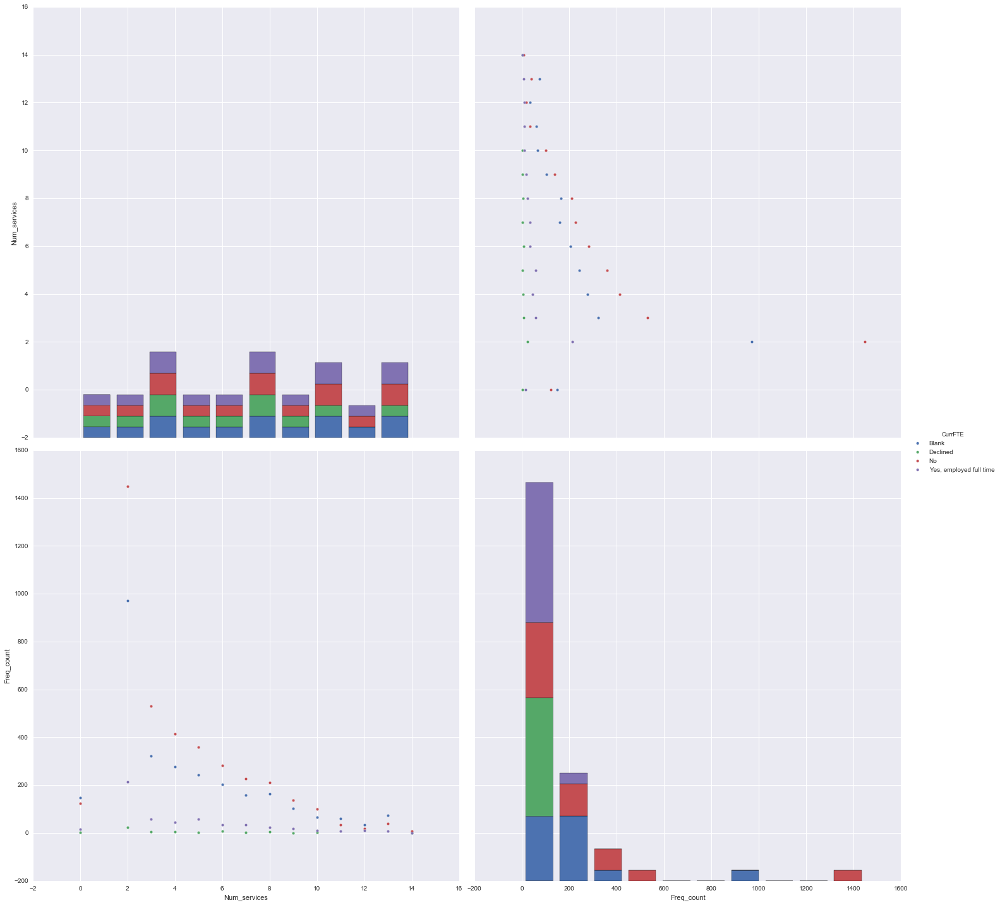

...

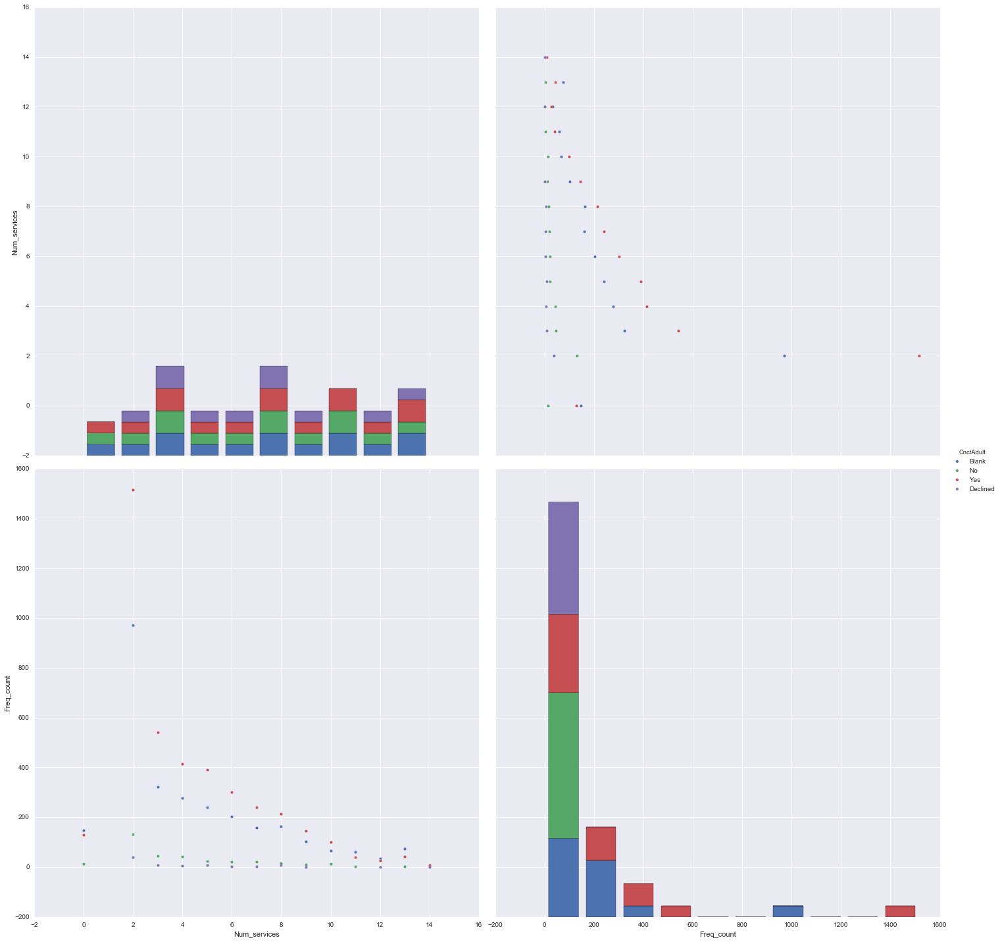

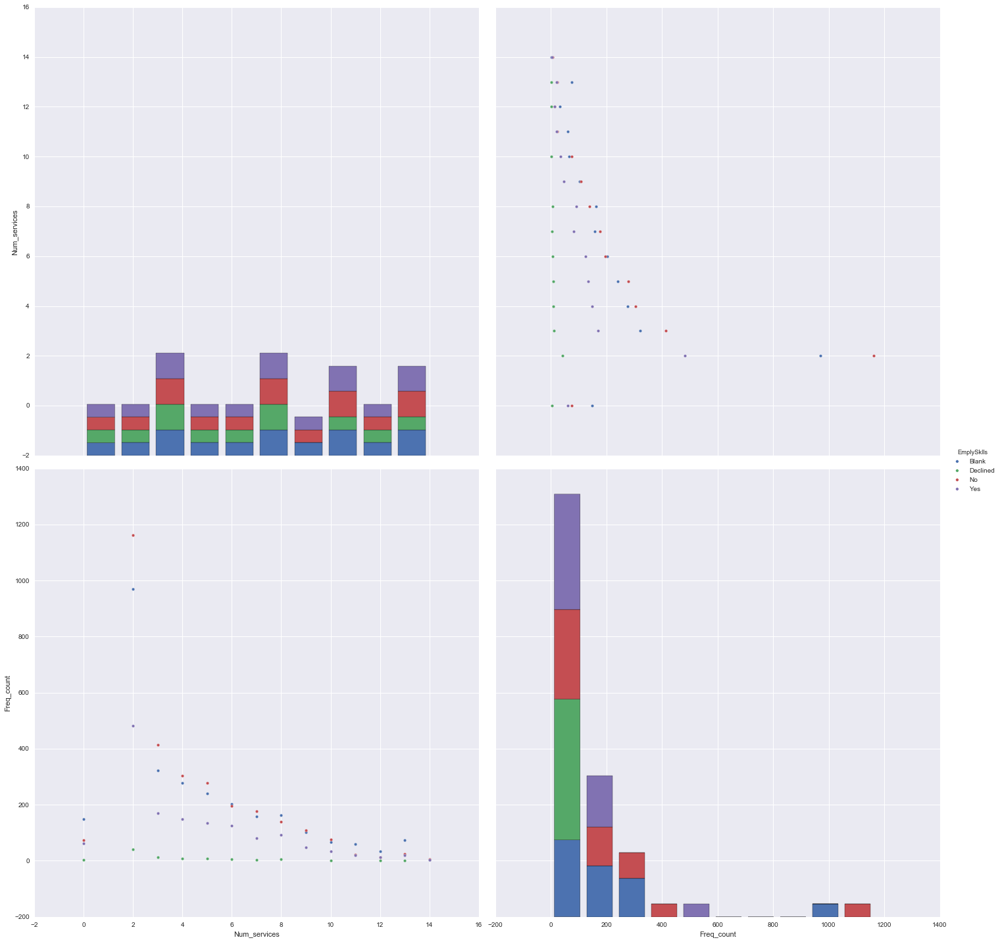

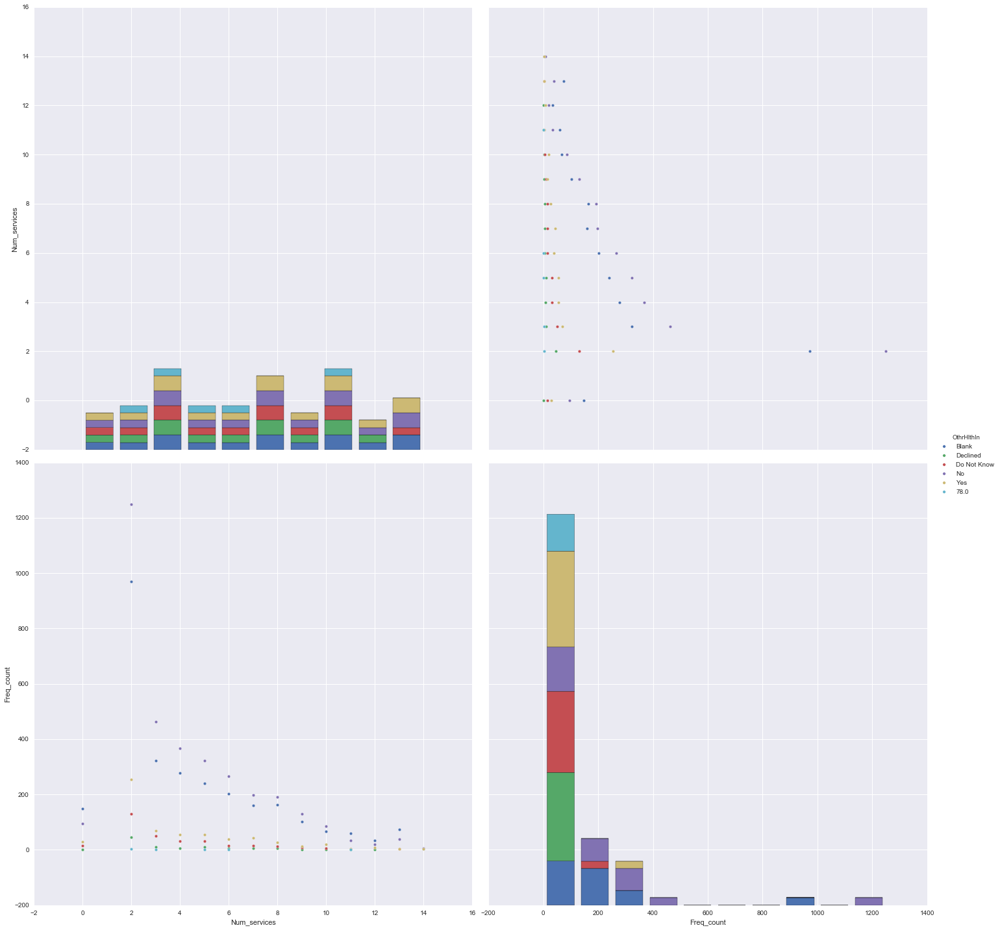

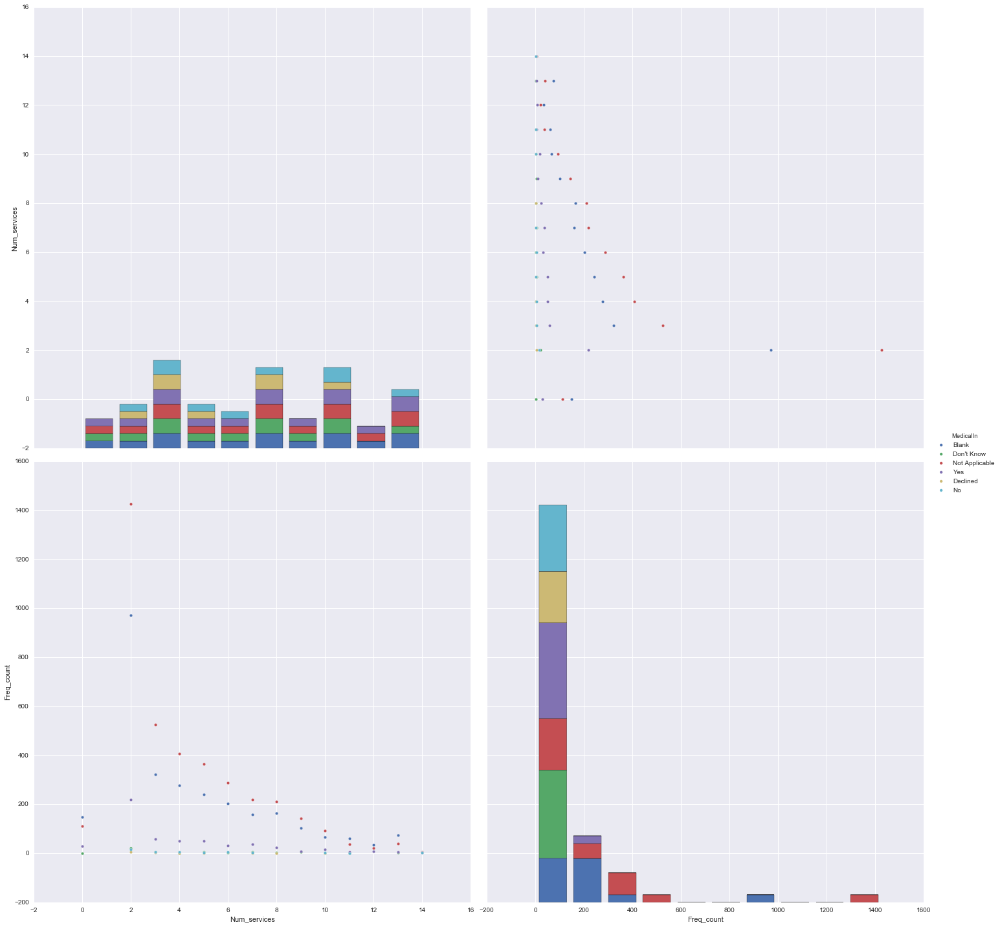

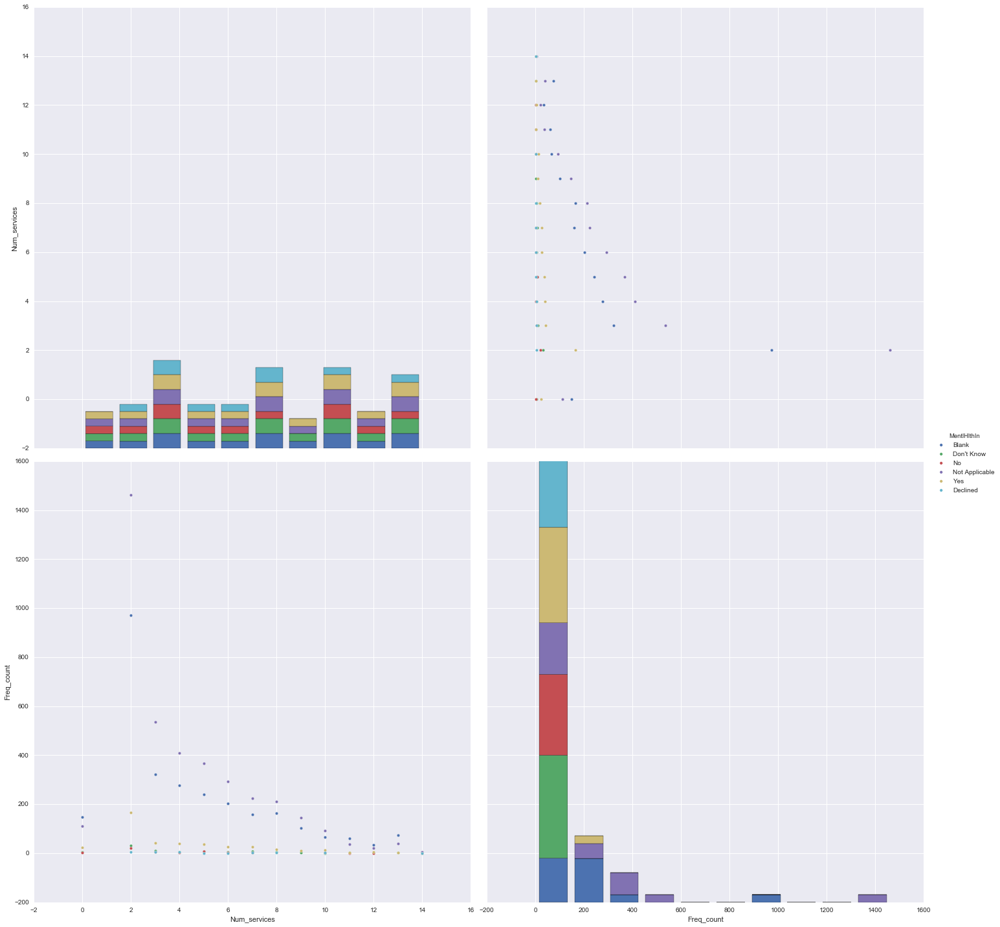

In [127]:
for col in targets:
    create_ns_plot(col, set_piv_tab_t(col))


# Saving dataset for later use in analysis

In [128]:
targets.to_csv('cohort1_targets_all.csv')

In [129]:
features.to_csv('cohort1_features_all.csv')

In [130]:
demographics.to_csv('cohort1_demographics_all.csv')